In [1]:
import pandas as pd

# 读取CSV文件
file_path = "Eu_lmd.csv"  
df = pd.read_csv(file_path)

# 只保留前1740行，前1740行数据较为完整，后面的数据就只有两列1st dopant valency,1st doping concentration
df = df.iloc[:1740, :]

# 查看前5行数据
print("前5行数据：")
print(df.head())

# 查看数据的基本信息
print("\n数据概况：")
print(df.info())

# 查看数值列的统计信息
print("\n数值列统计描述：")
print(df.describe())


前5行数据：
   1st dopant valency  1st doping concentration 2nd dopant  \
0                   3                      0.05        NaN   
1                   3                      0.20        NaN   
2                   3                      0.40        NaN   
3                   3                      0.60        NaN   
4                   3                      0.80        NaN   

   2nd dopant valency  2nd doping concentration  Temp. (K)  \
0                 NaN                       NaN      298.0   
1                 NaN                       NaN      298.0   
2                 NaN                       NaN      298.0   
3                 NaN                       NaN      298.0   
4                 NaN                       NaN      298.0   

   Emission max. (nm)  Excitation source (nm)  1st Excitation max. (nm)  \
0               619.0                   394.0                     394.0   
1               619.0                   394.0                     394.0   
2               619.0 

In [2]:
# 1. 填充数值型缺失值
df['1st doping concentration'].fillna(0, inplace=True)  # 填充为0，表示没有物质
df['Emission max. (nm)'].fillna(0, inplace=True)  # 填充为0，表示没有该波峰
df['1st Excitation max. (nm)'].fillna(0, inplace=True)  # 填充为0，表示没有该波峰
df['2nd doping concentration'].fillna(0, inplace=True)  # 假设没有物质或者物质含量为0， 这个变量名后面有个空格
df['2nd Excitation max. (nm)'].fillna(0, inplace=True)  # 填充为0，表示没有该波峰
df['3rd Excitation max. (nm)'].fillna(0, inplace=True)  # 填充为0，表示没有该波峰


# 打印处理后的缺失值情况
print(df.isnull().sum())

# 2. 填充类别型缺失值
df['2nd dopant'].fillna('No material', inplace=True)  # 填充为 'No material'，表示没有该物质
df['2nd dopant valency'].fillna(0, inplace=True)  # 假设缺失时valency为0

# 打印一下处理后的缺失值情况
print(df.isnull().sum())


1st dopant valency             0
1st doping concentration       0
2nd dopant                  1301
2nd dopant valency          1301
2nd doping concentration       0
Temp. (K)                      0
Emission max. (nm)             0
Excitation source (nm)         0
1st Excitation max. (nm)       0
2nd Excitation max. (nm)       0
3rd Excitation max. (nm)       0
dtype: int64
1st dopant valency          0
1st doping concentration    0
2nd dopant                  0
2nd dopant valency          0
2nd doping concentration    0
Temp. (K)                   0
Emission max. (nm)          0
Excitation source (nm)      0
1st Excitation max. (nm)    0
2nd Excitation max. (nm)    0
3rd Excitation max. (nm)    0
dtype: int64


/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/1264854949.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['1st doping concentration'].fillna(0, inplace=True)  # 填充为0，表示没有物质
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/1264854949.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we ar

数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


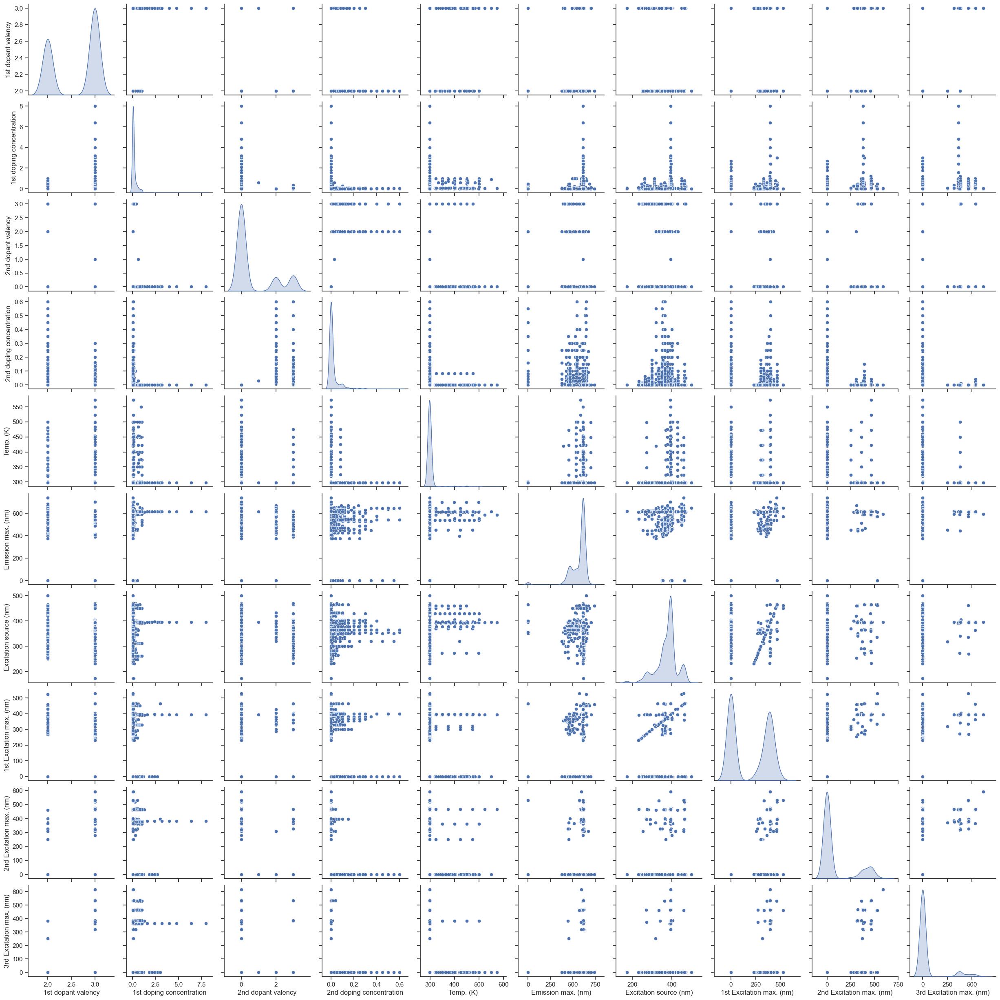

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 筛选出数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 2️⃣ 绘制 pairplot，设置对角线上显示分布
sns.set_theme(style="ticks")
sns.pairplot(df[numeric_cols], diag_kind='kde')  # 可选 'hist' 或 'kde'

plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


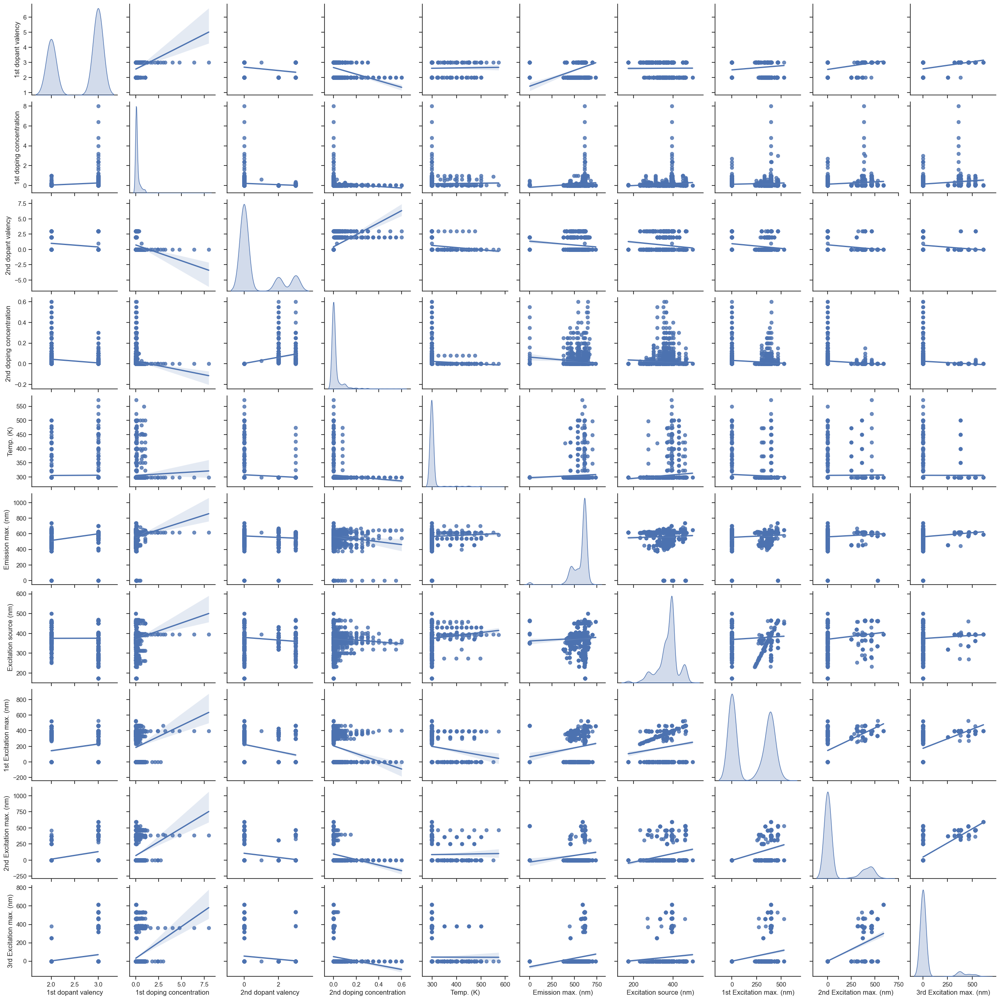

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 筛选出数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 2️⃣ 绘制 pairplot，设置对角线显示密度，散点叠加回归线
sns.set_theme(style="ticks")
sns.pairplot(
    df[numeric_cols],
    diag_kind='kde',    # 对角线：核密度
    kind='reg'          # 非对角线：散点+回归线
)

plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/3897783241.py:24: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/3897783241.py:24: UserWarning: Glyph 20540 (\N{CJK UNIFIED IDEOGRAPH-503C}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/3897783241.py:24: UserWarning: Glyph 29305 (\N{CJK UNIFIED IDEOGRAPH-7279}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/3897783241.py:24: UserWarning: Glyph 24449 (\N{CJK UNIFIED IDEOGRAPH-5F81}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/3897783241.py:24: UserWarning: Glyph 20004 (\N{CJK UNIFIED IDEOGRAPH-4E24}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/

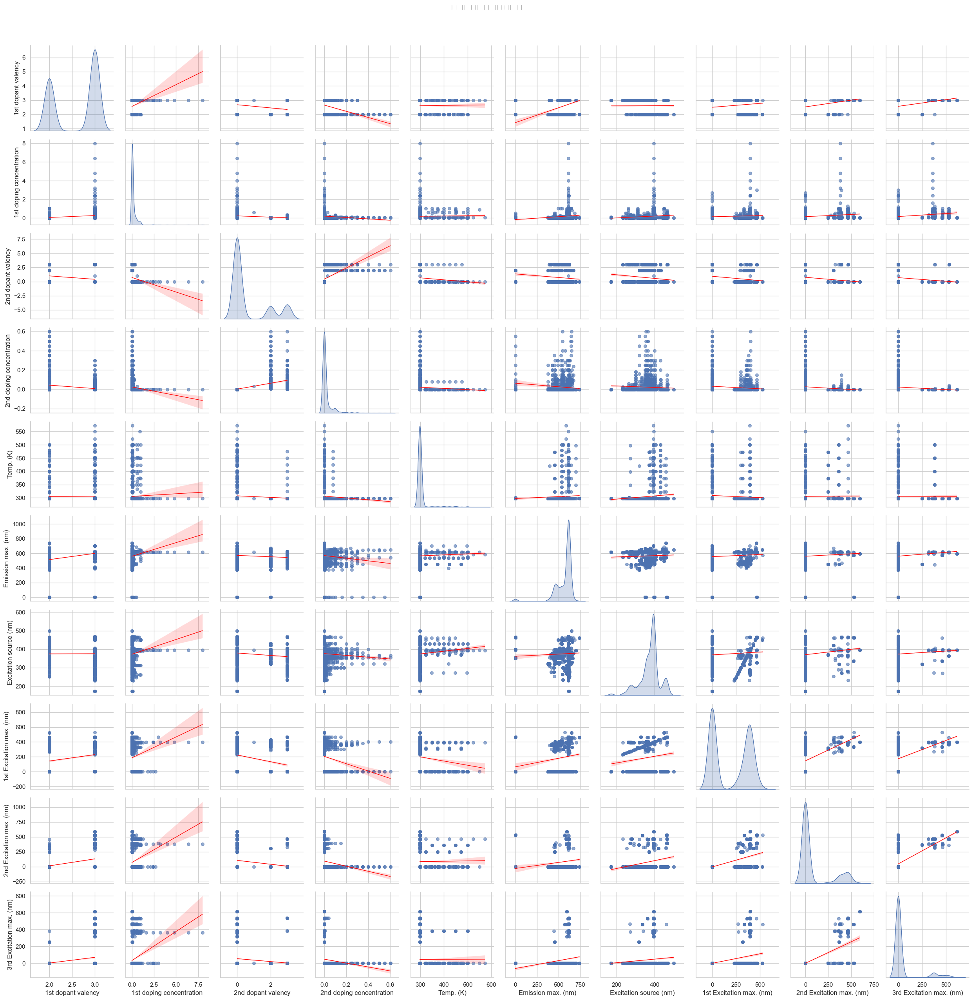

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 筛选出数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 2️⃣ 设置主题风格
sns.set_theme(style="whitegrid")

# 3️⃣ 绘制 pairplot，优化细节
pairplot = sns.pairplot(
    df[numeric_cols],
    diag_kind='kde',      # 对角线核密度
    kind='reg',           # 散点+回归拟合线
    plot_kws={
        'scatter_kws': {'alpha': 0.6, 's': 30},  # 散点透明度和大小
        'line_kws': {'color': 'red', 'linewidth': 1}  # 回归线样式
    }
)

# 4️⃣ 调整标题和子图边距
pairplot.fig.suptitle("数值特征两两关系可视化", fontsize=16, y=1.02)
pairplot.fig.tight_layout()

plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/653968420.py:21: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/653968420.py:21: UserWarning: Glyph 20540 (\N{CJK UNIFIED IDEOGRAPH-503C}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/653968420.py:21: UserWarning: Glyph 29305 (\N{CJK UNIFIED IDEOGRAPH-7279}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/653968420.py:21: UserWarning: Glyph 24449 (\N{CJK UNIFIED IDEOGRAPH-5F81}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_88308/653968420.py:21: UserWarning: Glyph 20004 (\N{CJK UNIFIED IDEOGRAPH-4E24}) missing from font(s) Arial.
  pairplot.fig.tight_layout()
/var/folde

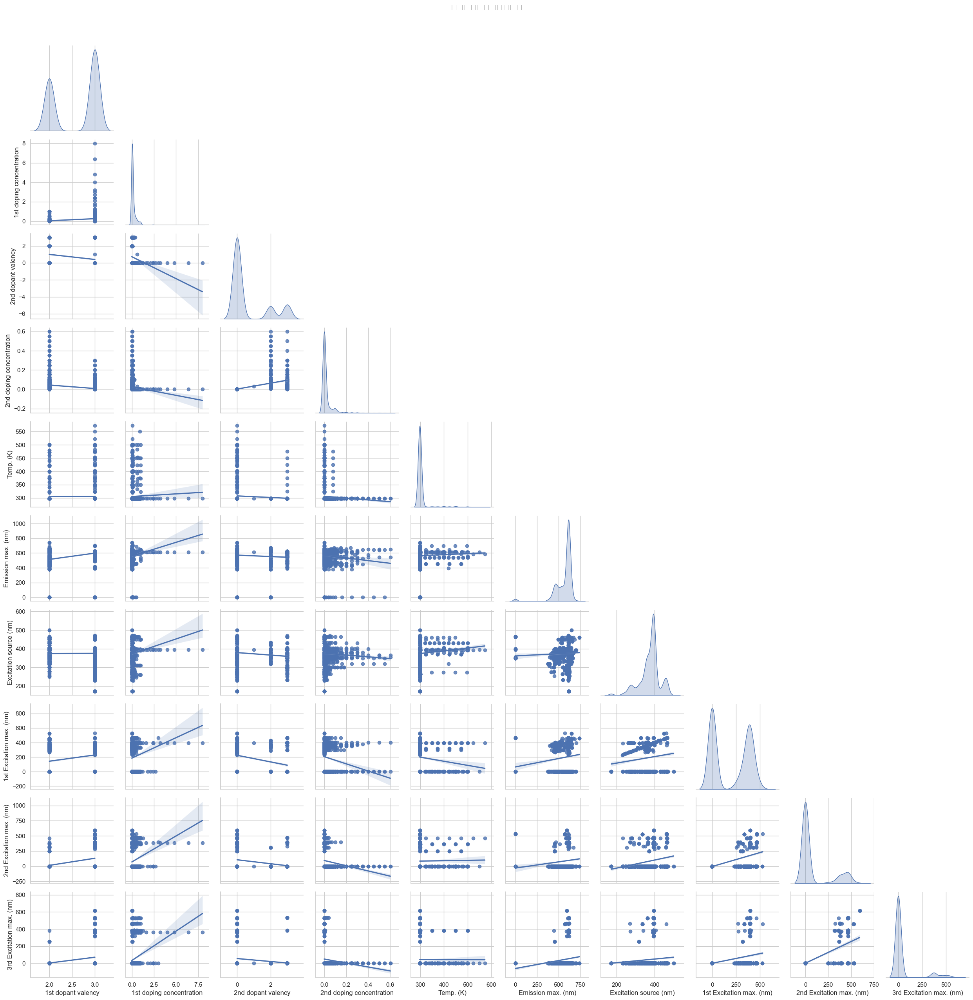

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 筛选出数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 2️⃣ 设置主题风格
sns.set_theme(style="whitegrid")

# 3️⃣ 绘制 pairplot，设置对角线显示密度，散点叠加回归线
pairplot = sns.pairplot(
    df[numeric_cols],
    kind="reg",         # 非对角线：散点+回归线
    diag_kind="kde",    # 对角线：核密度
    corner=True         # 隐藏上半部分的图（去除重复）
)

# 4️⃣ 调整标题和子图边距
pairplot.fig.suptitle("数值特征两两关系可视化", fontsize=16, y=1.02)
pairplot.fig.tight_layout()

plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: The pale

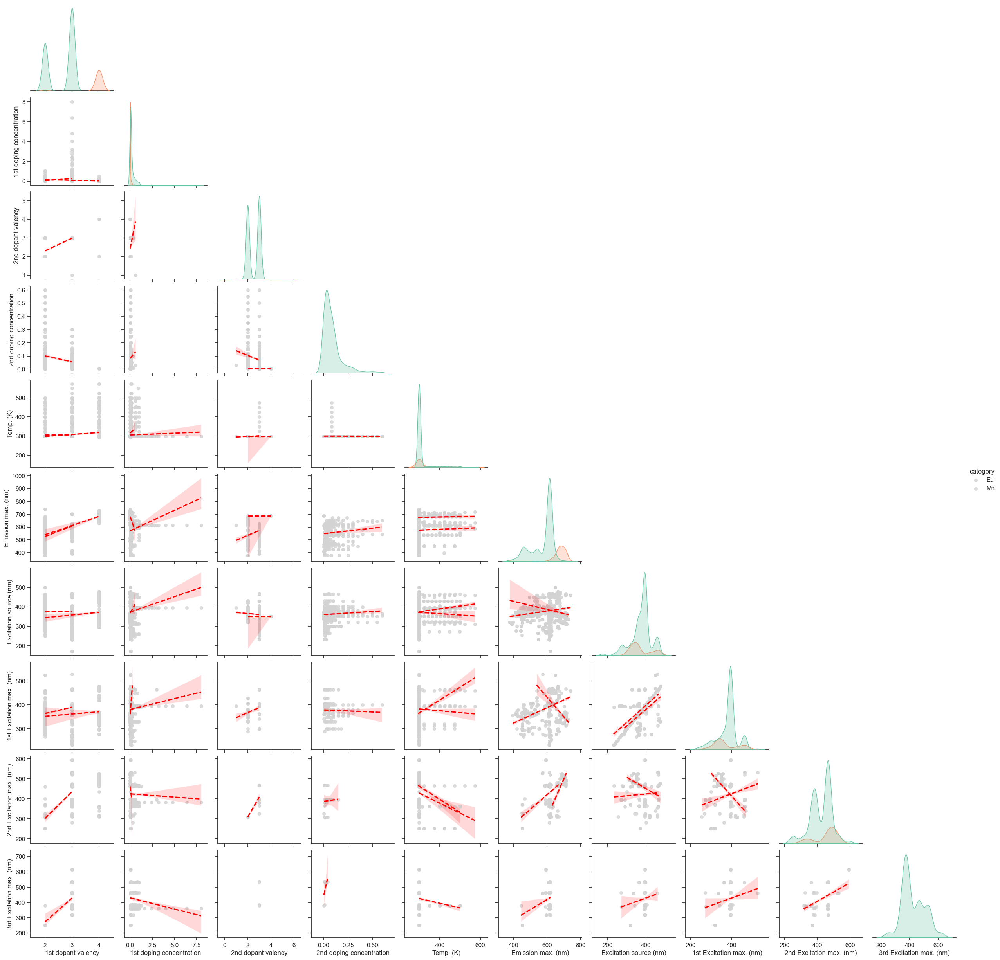

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path1 = "Eu_lmd.csv"
file_path2 = "Mn_lmd.csv"

df1 = pd.read_csv(file_path1)
df2 = pd.read_csv(file_path2)

# 2️⃣ 为每个数据集添加一个分类列
df1['category'] = 'Eu'  # 给Eu_lmd数据集添加类别
df2['category'] = 'Mn'  # 给Mn_lmd数据集添加类别

# 3️⃣ 拼接数据
df = pd.concat([df1, df2], ignore_index=True)

# 4️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 5️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 6️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线KDE使用黑色实线
sns.pairplot(df[numeric_cols + ['category']], 
             hue="category", 
             kind='reg', 
             plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                       'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
             diag_kind='kde',  # 对角线显示KDE
             palette=palette,  # 直方图的调色板
             corner=True)  # 只显示下三角部分图形，避免重复显示

# 7️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

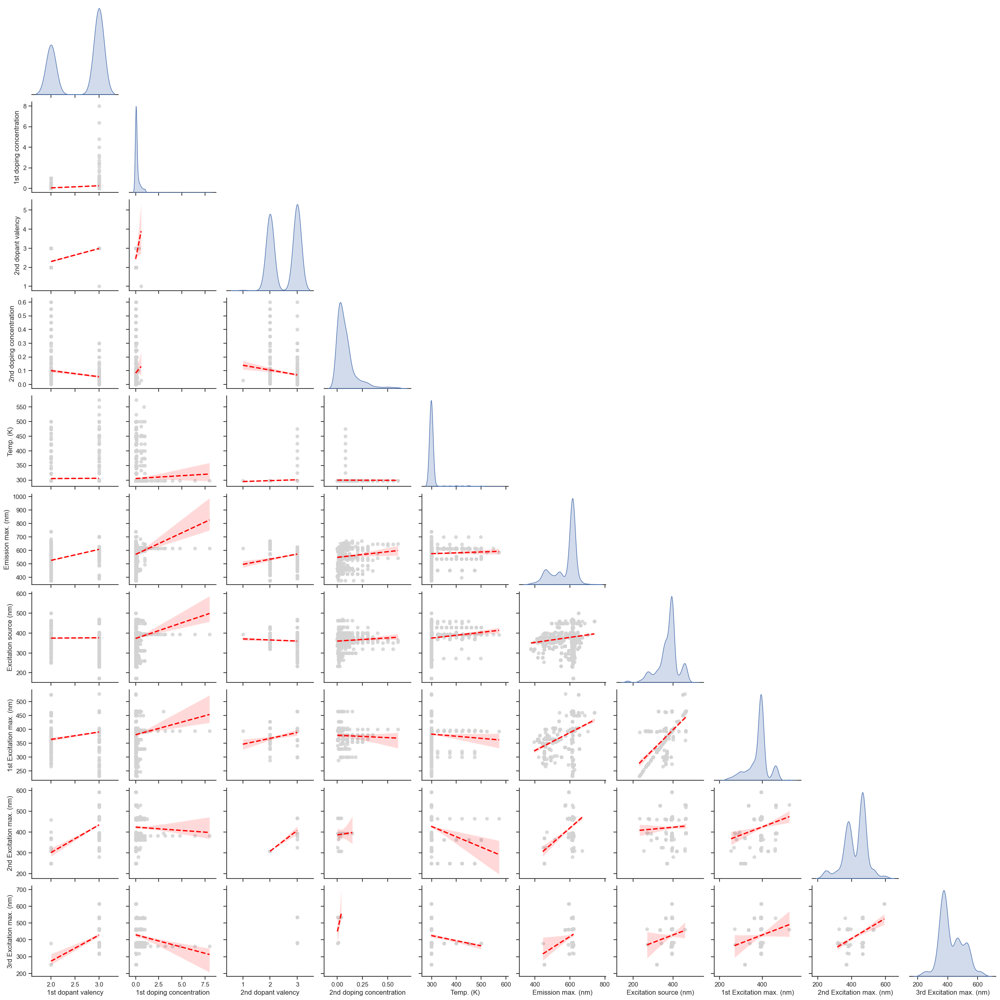

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线KDE使用黑色实线
sns.pairplot(df[numeric_cols], 
             kind='reg', 
             plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                       'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
             diag_kind='kde',  # 对角线显示KDE
             palette=palette,  # 直方图的调色板
             corner=True)  # 只显示下三角部分图形，避免重复显示

# 5️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


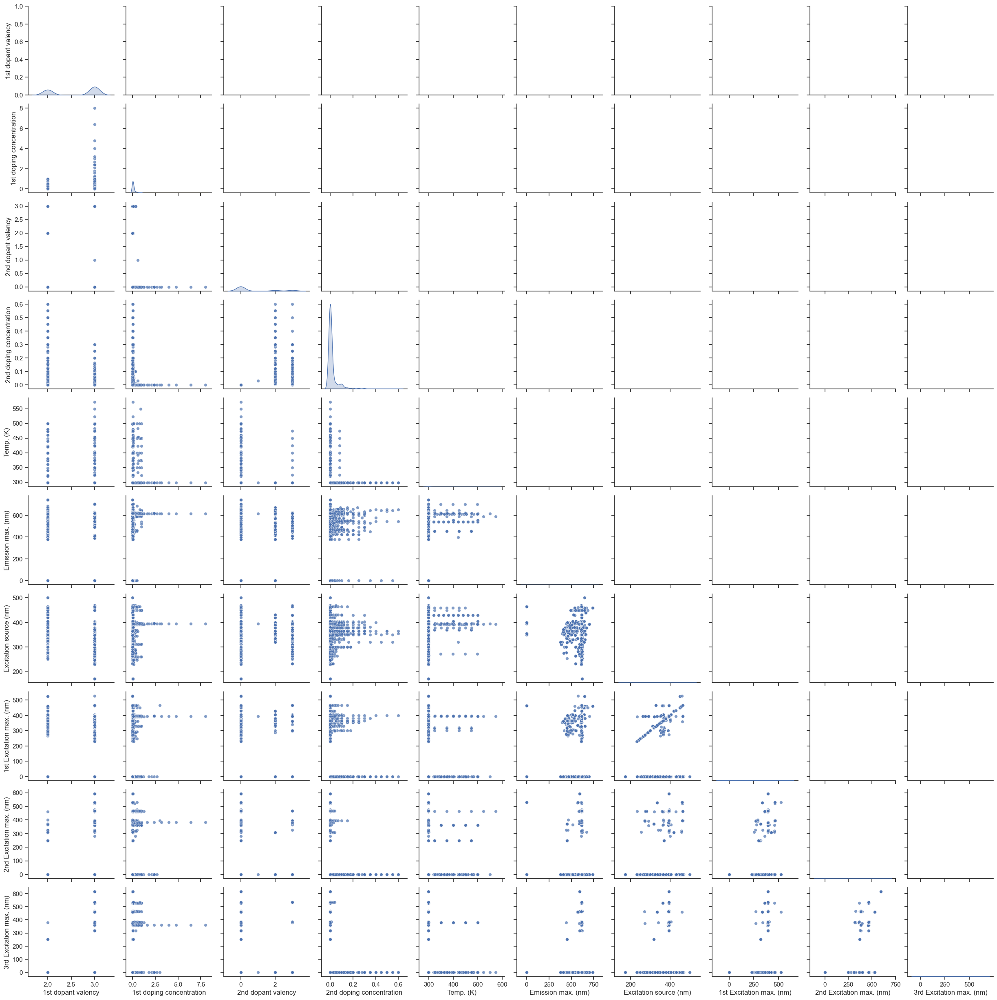

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 筛选数值型特征
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 2️⃣ 使用 PairGrid，只绘制下三角和对角线
sns.set_theme(style="ticks")

g = sns.PairGrid(df[numeric_cols])

# 下三角：散点图
g.map_lower(sns.scatterplot, s=30, alpha=0.7)

# 对角线：核密度曲线
g.map_diag(sns.kdeplot, fill=True)

# 上三角：留空，不画
# g.map_upper(函数) -> 不调用

plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

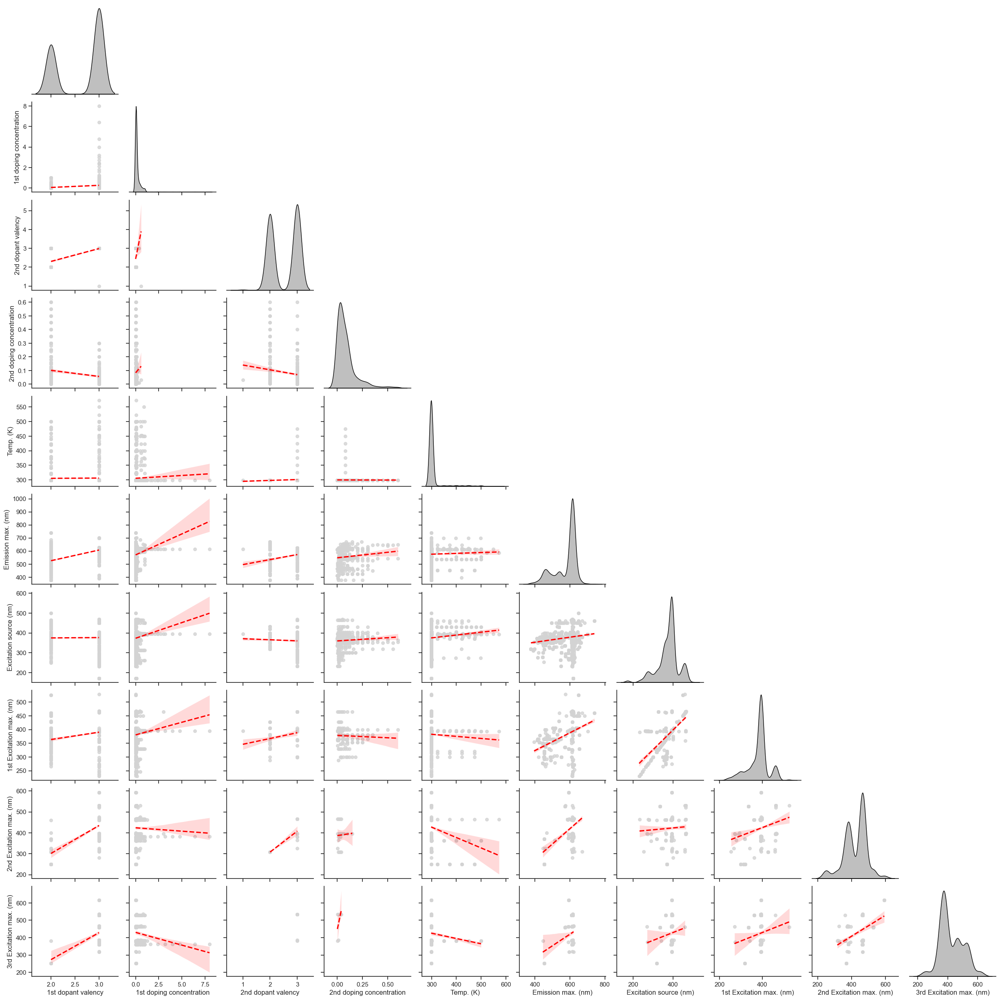

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线KDE使用黑色实线
sns.pairplot(df[numeric_cols], 
             kind='reg', 
             plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                       'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
             diag_kind='kde',  # 对角线显示KDE
             diag_kws={'color': 'black'},  # 对角线KDE使用黑色实线
             palette=palette,  # 直方图的调色板
             corner=True)  # 只显示下三角部分图形，避免重复显示

# 5️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

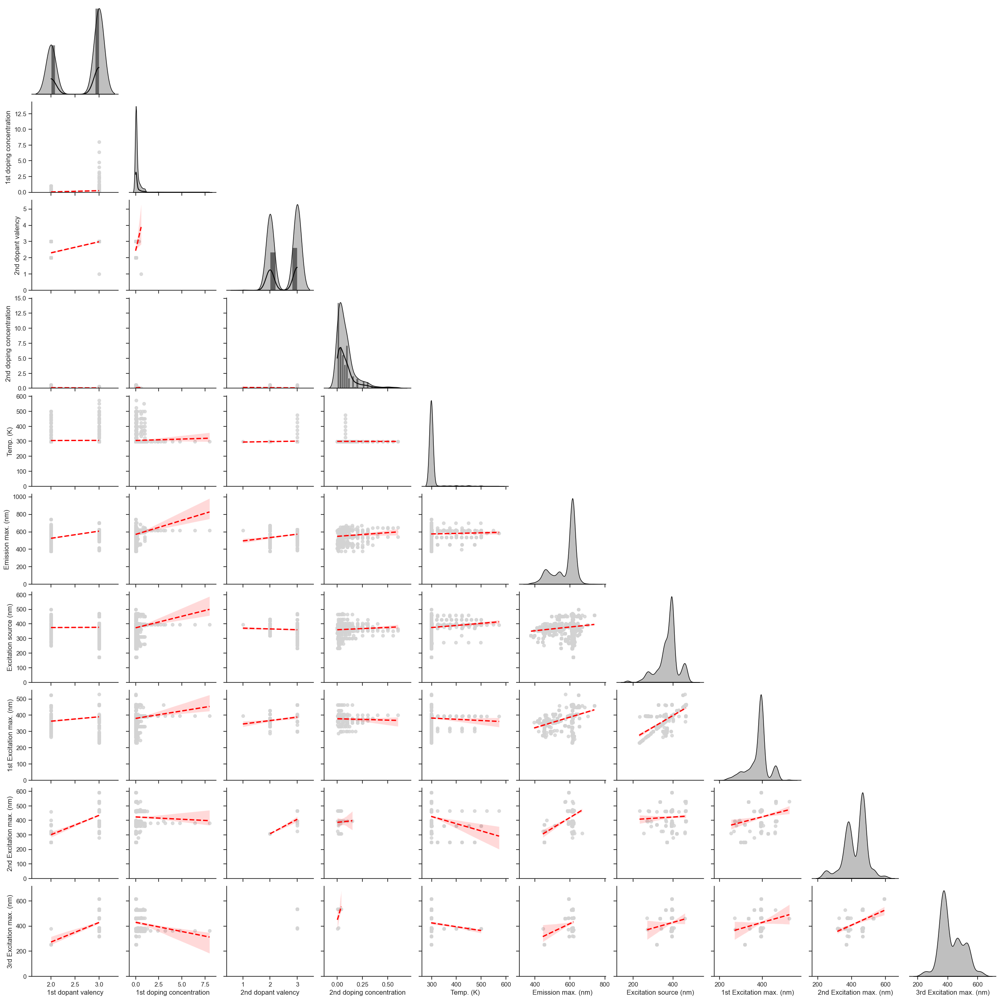

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线上的KDE和直方图同时显示
g = sns.pairplot(df[numeric_cols], 
                 kind='reg', 
                 plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                           'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
                 diag_kind='kde',  # 对角线显示KDE
                 diag_kws={'color': 'black'},  # 对角线KDE使用黑色实线
                 palette=palette,  # 直方图的调色板
                 corner=True)  # 只显示下三角部分图形，避免重复显示

# 在对角线上同时绘制KDE和直方图
for i in range(len(numeric_cols)):
    ax = g.axes[i, i]
    sns.histplot(df[numeric_cols[i]], kde=True, color='black', ax=ax, stat="density", linewidth=1)

# 5️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

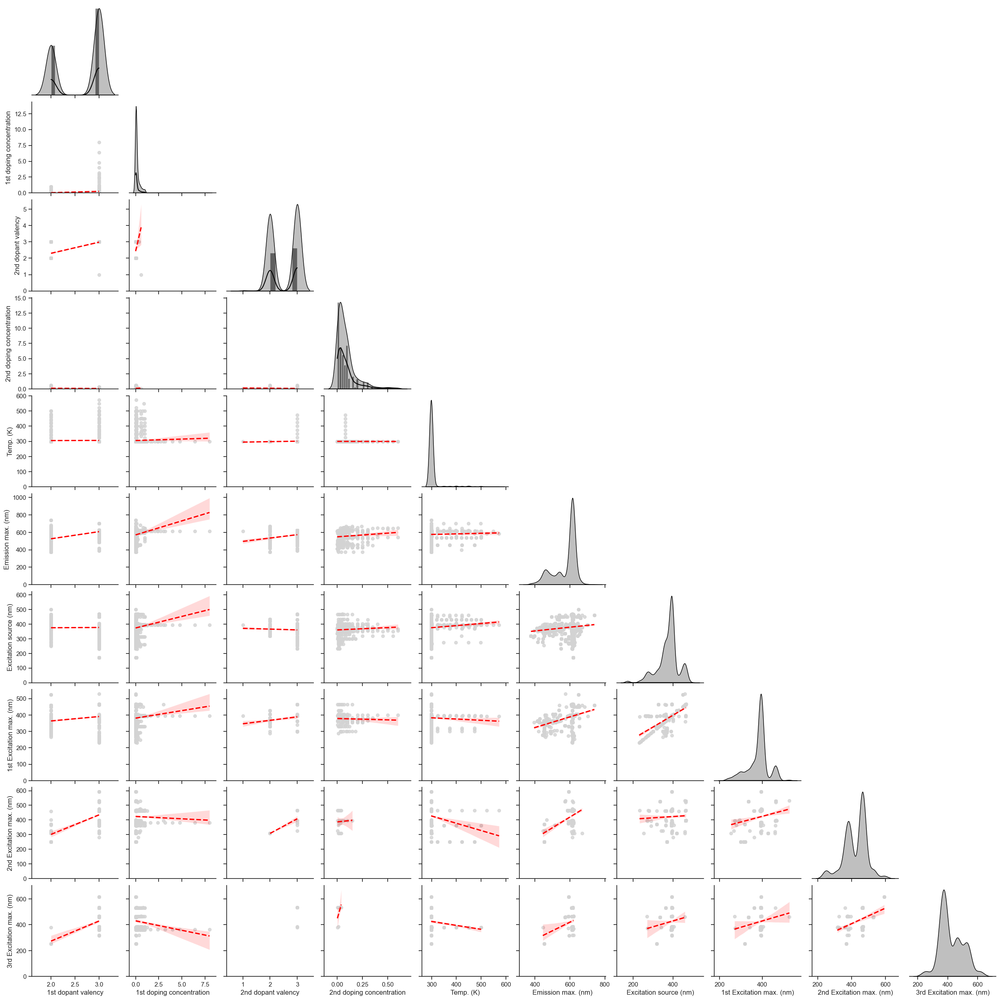

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线上的KDE和直方图同时显示
g = sns.pairplot(df[numeric_cols], 
                 kind='reg', 
                 plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                           'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
                 diag_kind='kde',  # 对角线显示KDE
                 diag_kws={'color': 'black'},  # 对角线KDE使用黑色实线
                 palette=palette,  # 直方图的调色板
                 corner=True)  # 只显示下三角部分图形，避免重复显示

# 在对角线上同时绘制KDE和直方图
for i in range(len(numeric_cols)):
    ax = g.axes[i, i]
    sns.histplot(df[numeric_cols[i]], kde=True, color='black', ax=ax, stat="density", linewidth=1)

# 5️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

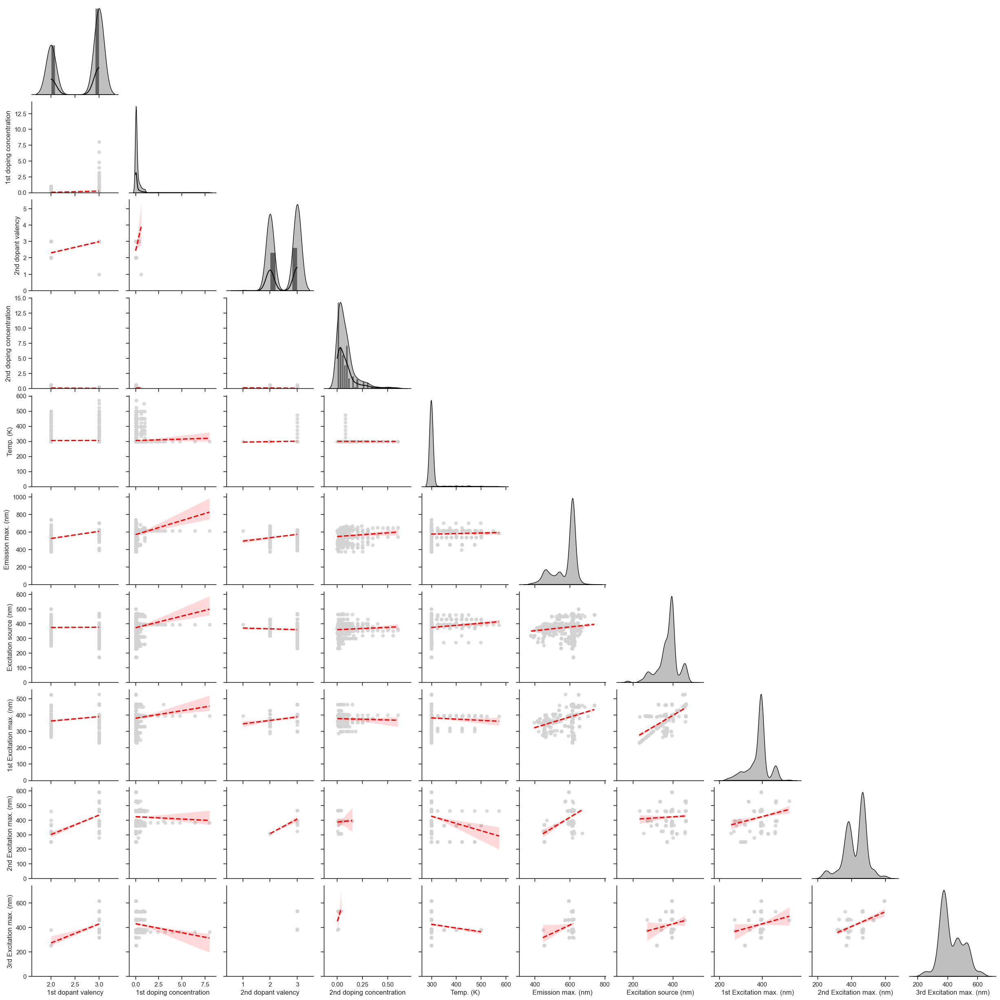

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线上的KDE和直方图同时显示
g = sns.pairplot(df[numeric_cols], 
                 kind='reg', 
                 plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                           'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
                 diag_kind='kde',  # 对角线显示KDE
                 diag_kws={'color': 'black'},  # 对角线KDE使用黑色实线
                 palette=palette,  # 直方图的调色板
                 corner=True)  # 只显示下三角部分图形，避免重复显示

# 5️⃣ 手动遍历每个对角线并绘制直方图和KDE
for i in range(len(numeric_cols)):
    ax = g.axes[i, i]
    # 使用sns.histplot绘制直方图和KDE，并确保每个对角线都有直方图
    sns.histplot(df[numeric_cols[i]], kde=True, ax=ax, stat="density", linewidth=1, color="black")

# 6️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

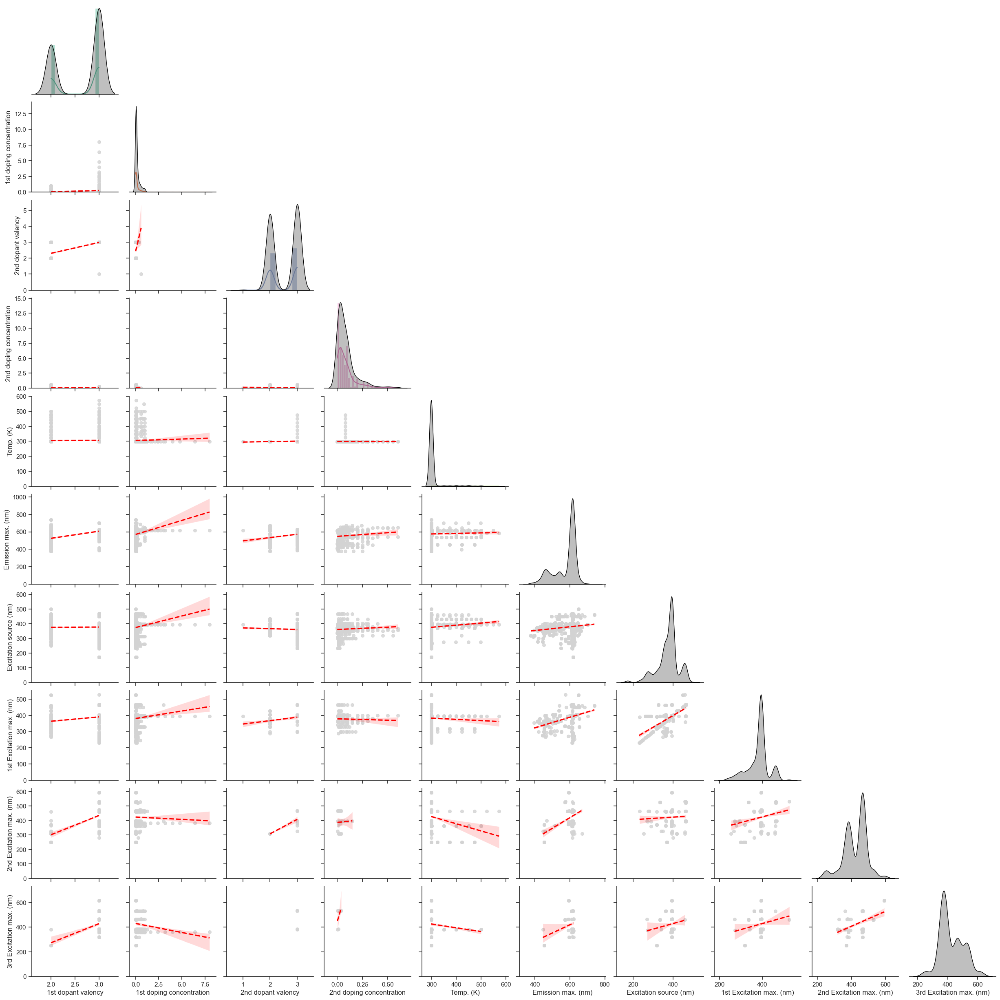

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置配色和绘制pairplot
sns.set_theme(style="ticks")

# 自定义配色
palette = sns.color_palette("Set2")  # 用不同颜色的调色板

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线上的KDE和直方图同时显示
g = sns.pairplot(df[numeric_cols], 
                 kind='reg', 
                 plot_kws={'scatter_kws': {'color': 'lightgray', 's': 30},  # 散点图浅灰色原点
                           'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
                 diag_kind='kde',  # 对角线显示KDE
                 diag_kws={'color': 'black'},  # 对角线KDE使用黑色实线
                 palette=palette,  # 直方图的调色板
                 corner=True)  # 只显示下三角部分图形，避免重复显示

# 5️⃣ 手动遍历每个对角线并绘制直方图和KDE，每个直方图使用不同的颜色
for i in range(len(numeric_cols)):
    ax = g.axes[i, i]
    # 为每个直方图分配不同的颜色
    color = palette[i % len(palette)]  # 确保颜色循环使用
    sns.histplot(df[numeric_cols[i]], kde=True, ax=ax, stat="density", linewidth=1, color=color)

# 6️⃣ 显示图形
plt.show()


数值型特征有： ['1st dopant valency', '1st doping concentration', '2nd dopant valency', '2nd doping concentration', 'Temp. (K)', 'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vec

<Figure size 1600x1200 with 0 Axes>

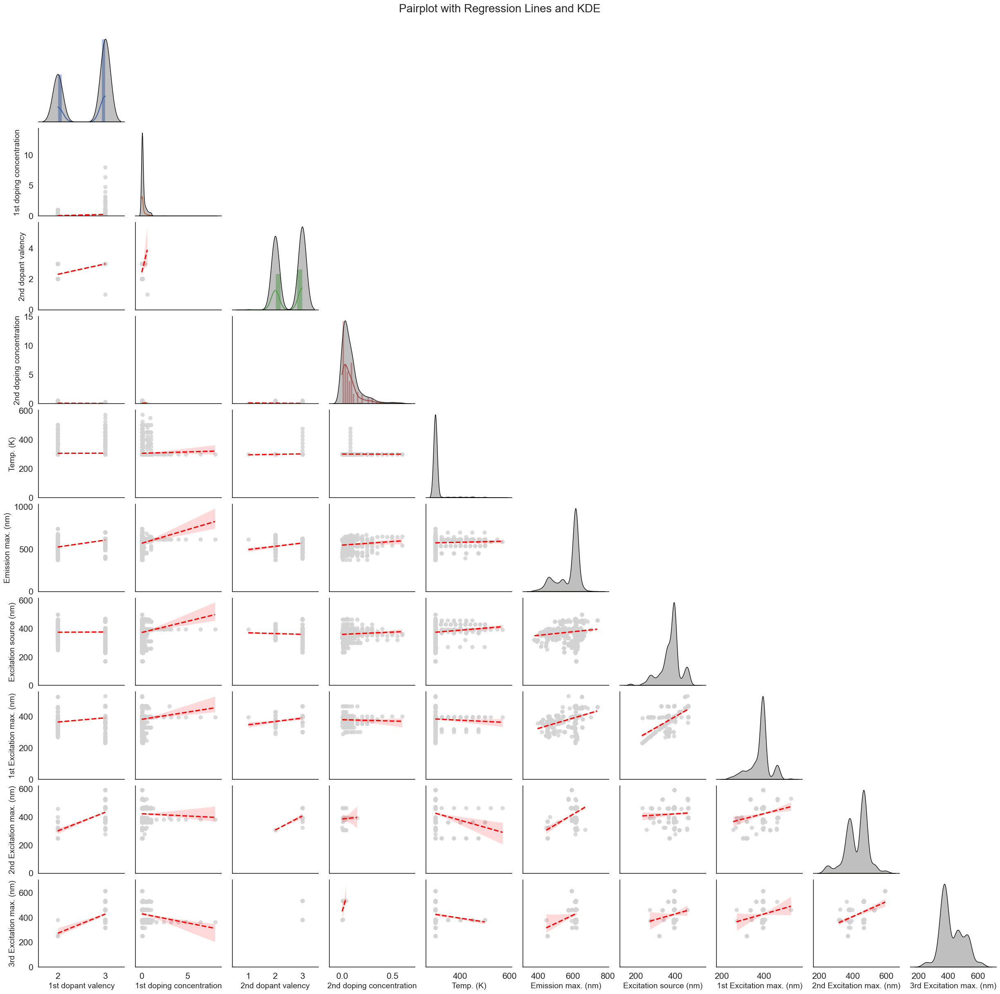

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ 读取CSV文件
file_path = "Eu_lmd.csv"
df = pd.read_csv(file_path)

# 2️⃣ 筛选数值型变量
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
print("数值型特征有：", numeric_cols)

# 3️⃣ 设置Seaborn主题
sns.set_theme(style="white", palette="muted", font_scale=1.4)

# 设置画布大小
plt.figure(figsize=(16, 12))

# 4️⃣ 绘制pairplot，设置所有需求：
# - 散点图用浅灰色
# - 回归线用红色虚线
# - 对角线上的KDE和直方图同时显示
g = sns.pairplot(df[numeric_cols], 
                 kind='reg', 
                 plot_kws={'scatter_kws': {'color': 'lightgray', 's': 40},  # 散点图浅灰色原点
                           'line_kws': {'color': 'red', 'linestyle': '--'}},  # 回归线红色虚线
                 diag_kind='kde',  # 对角线显示KDE
                 diag_kws={'color': 'black'},  # 对角线KDE使用黑色实线
                 palette="muted",  # 使用柔和的配色方案
                 corner=True)  # 只显示下三角部分图形，避免重复显示

# 5️⃣ 手动调整每个对角线的直方图，保持图形的整洁性
for i in range(len(numeric_cols)):
    ax = g.axes[i, i]
    color = sns.color_palette("muted")[i % len(sns.color_palette("muted"))]  # 循环使用调色板中的颜色
    sns.histplot(df[numeric_cols[i]], kde=True, ax=ax, stat="density", linewidth=1, color=color)

# 6️⃣ 设置合适的标题和标签
plt.subplots_adjust(top=0.95)  # 调整图形顶部间距
g.fig.suptitle("Pairplot with Regression Lines and KDE", fontsize=20)  # 设置标题

# 遍历每个子图，如果存在就设置X轴和Y轴标签
for i, ax in enumerate(g.axes.flat):
    if ax:  # 确保ax不是None
        ax.set_xlabel(ax.get_xlabel(), fontsize=14)  # 设置X轴标签
        ax.set_ylabel(ax.get_ylabel(), fontsize=14)  # 设置Y轴标签

# 7️⃣ 显示图形
plt.show()


In [16]:
# 对 分类变量：1st dopant valency 和 2nd dopant valency 进行独热编码，以便于输入模型
df = pd.get_dummies(df, columns=['1st dopant valency', '2nd dopant valency'], drop_first=True)

# 查看新的数据框
print(df.head())


   1st doping concentration   2nd dopant  2nd doping concentration  Temp. (K)  \
0                      0.05  No material                       0.0      298.0   
1                      0.20  No material                       0.0      298.0   
2                      0.40  No material                       0.0      298.0   
3                      0.60  No material                       0.0      298.0   
4                      0.80  No material                       0.0      298.0   

   Emission max. (nm)  Excitation source (nm)  1st Excitation max. (nm)  \
0               619.0                   394.0                     394.0   
1               619.0                   394.0                     394.0   
2               619.0                   394.0                     394.0   
3               619.0                   394.0                     394.0   
4               619.0                   394.0                     394.0   

   2nd Excitation max. (nm)  3rd Excitation max. (nm)  1st dop

In [4]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# 标准化：数据转换为均值为0，标准差为1的分布
scaler = StandardScaler()

# 选择数值型列进行标准化
num_columns = ['1st doping concentration', '2nd doping concentration', 'Temp. (K)', 
               'Emission max. (nm)', 'Excitation source (nm)', '1st Excitation max. (nm)', 
               '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']

df[num_columns] = scaler.fit_transform(df[num_columns])




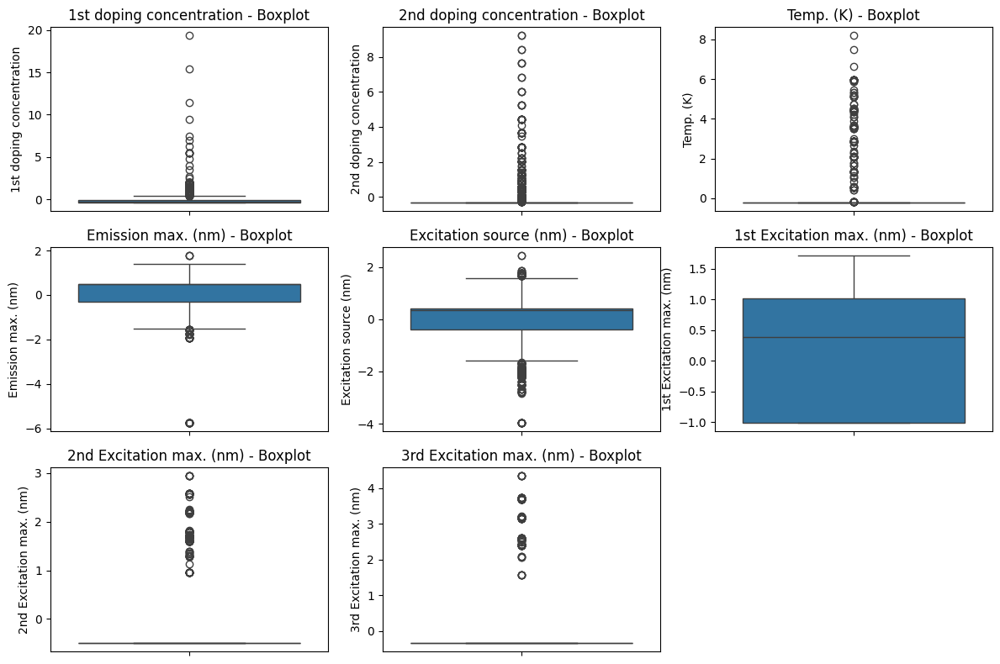

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# 使用箱线图检查每一列的异常值
plt.figure(figsize=(12, 8))
for i, col in enumerate(num_columns):
    plt.subplot(3, 3, i+1)
    sns.boxplot(df[col])
    plt.title(f'{col} - Boxplot')
plt.tight_layout()
plt.show()


In [31]:
import numpy as np
from scipy import stats

# 计算每一列的 Z-score
z_scores = stats.zscore(df[num_columns])

# 找出 Z-score 大于 3 的数据点，表示异常值
outliers = (np.abs(z_scores) > 3)

# 展示包含异常值的行
outlier_rows = np.where(outliers)[0]  # 获取所有异常值所在的行
df_outliers = df.iloc[outlier_rows]
df_outliers


,1st doping concentration,2nd dopant,2nd doping concentration,Temp. (K),Emission max. (nm),Excitation source (nm),1st Excitation max. (nm),2nd Excitation max. (nm),3rd Excitation max. (nm),1st dopant valency_3,2nd dopant valency_1.0,2nd dopant valency_2.0,2nd dopant valency_3.0
9,0.429554,No material,-0.346431,-0.239650,0.477797,0.384297,1.029843,1.695740,3.208514,True,False,False,False
15,-0.411904,No material,-0.346431,3.593549,-1.151626,-0.104666,0.642261,0.953506,-0.333610,False,False,False,False
16,-0.411904,No material,-0.346431,5.126829,-1.151626,-0.104666,0.642261,0.953506,-0.333610,False,False,False,False
20,-0.362406,No material,-0.346431,3.593549,-1.151626,-0.104666,0.606087,0.953506,-0.333610,False,False,False,False
21,-0.362406,No material,-0.346431,5.126829,-1.151626,-0.104666,0.606087,0.953506,-0.333610,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734,-0.213914,Bi,-0.266713,-0.239650,0.508349,0.364738,1.024676,2.206025,3.734120,True,False,False,True
1735,-0.213914,Bi,-0.186995,-0.239650,0.508349,0.364738,1.024676,2.206025,3.734120,True,False,False,True
1736,-0.213914,Bi,-0.027558,-0.239650,0.508349,0.364738,1.024676,2.206025,3.734120,True,False,False,True
1737,-0.213914,Bi,0.131879,-0.239650,0.508349,0.364738,1.024676,2.206025,3.734120,True,False,False,True


In [32]:
import numpy as np
from scipy import stats

# 计算每一列的 Z-score
z_scores = stats.zscore(df[num_columns])

# 找出 Z-score 大于 3 的数据点，表示异常值
outliers = (np.abs(z_scores) > 3)

# 获取包含异常值的所有行索引
outlier_rows = np.where(outliers)[0]

# 提取出所有包含异常值的行
df_outliers = df.iloc[outlier_rows]

# 确保所有行都能输出显示
pd.set_option('display.max_rows', None)  # 设置最大显示行数为无限制
print(df_outliers)  # 显示所有包含异常值的行

##观察之后这个异常值好像不能删除，这是由于物质不同导致的差异


      1st doping concentration   2nd dopant  2nd doping concentration  \
9                     0.429554  No material                 -0.346431   
15                   -0.411904  No material                 -0.346431   
16                   -0.411904  No material                 -0.346431   
20                   -0.362406  No material                 -0.346431   
21                   -0.362406  No material                 -0.346431   
25                   -0.263411  No material                 -0.346431   
26                   -0.263411  No material                 -0.346431   
32                   -0.411904  No material                 -0.346431   
33                   -0.411904  No material                 -0.346431   
41                    0.800785  No material                 -0.346431   
42                    0.800785  No material                 -0.346431   
48                    2.038223  No material                 -0.346431   
49                    2.038223  No material        

In [32]:
# ##把231条删了
# Q1 = df[num_columns].quantile(0.25)
# Q3 = df[num_columns].quantile(0.75)
# IQR = Q3 - Q1

# # 过滤掉异常值
# df_no_outliers = df[~((df[num_columns] < (Q1 - 1.5 * IQR)) | (df[num_columns] > (Q3 + 1.5 * IQR))).any(axis=1)]


In [33]:
#标记异常值但不删除，把异常值标记成 1
# 创建一个新列，用来标记异常值
import numpy as np
from scipy import stats

# 计算每一列的 Z-score
z_scores = stats.zscore(df[num_columns])

# 找出 Z-score 大于 3 的数据点，表示异常值
outliers = (np.abs(z_scores) > 3)

# 创建一个新列 'outlier_flag'，用于标记异常值
df['outlier_flag'] = np.where(outliers.any(axis=1), 1, 0)

# 查看含有异常值的行
df_outliers = df[df['outlier_flag'] == 1]
df_outliers



,1st doping concentration,2nd dopant,2nd doping concentration,Temp. (K),Emission max. (nm),Excitation source (nm),1st Excitation max. (nm),2nd Excitation max. (nm),3rd Excitation max. (nm),1st dopant valency_3,2nd dopant valency_1.0,2nd dopant valency_2.0,2nd dopant valency_3.0,outlier_flag
9,0.429554,No material,-0.346431,-0.239650,0.477797,0.384297,1.029843,1.695740,3.208514,True,False,False,False,1
15,-0.411904,No material,-0.346431,3.593549,-1.151626,-0.104666,0.642261,0.953506,-0.333610,False,False,False,False,1
16,-0.411904,No material,-0.346431,5.126829,-1.151626,-0.104666,0.642261,0.953506,-0.333610,False,False,False,False,1
20,-0.362406,No material,-0.346431,3.593549,-1.151626,-0.104666,0.606087,0.953506,-0.333610,False,False,False,False,1
21,-0.362406,No material,-0.346431,5.126829,-1.151626,-0.104666,0.606087,0.953506,-0.333610,False,False,False,False,1
25,-0.263411,No material,-0.346431,3.593549,-1.151626,-0.104666,0.538906,0.953506,-0.333610,False,False,False,False,1
26,-0.263411,No material,-0.346431,5.126829,-1.151626,-0.104666,0.538906,0.953506,-0.333610,False,False,False,False,1
32,-0.411904,No material,-0.346431,4.421521,0.498165,0.354959,1.024676,1.602961,2.561029,True,False,False,False,1
33,-0.411904,No material,-0.346431,5.954800,0.498165,0.354959,1.024676,1.602961,2.561029,True,False,False,False,1
41,0.800785,No material,-0.346431,4.421521,0.498165,0.354959,1.024676,1.602961,2.561029,True,False,False,False,1


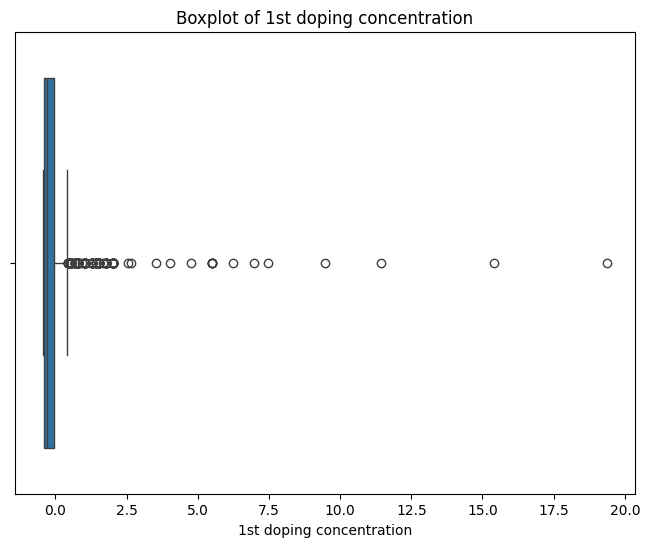

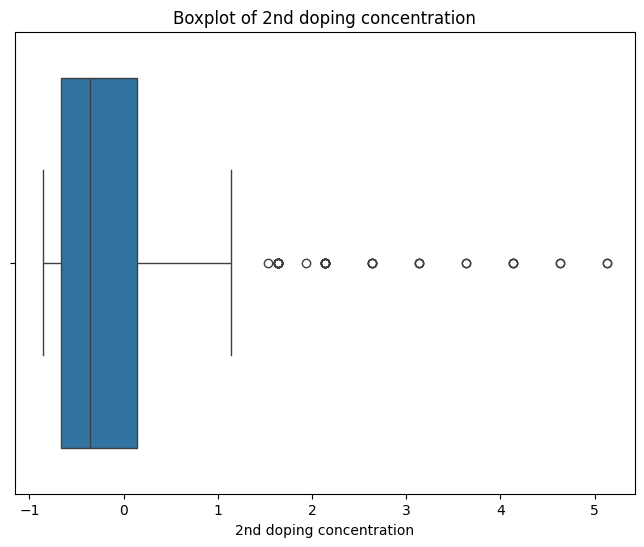

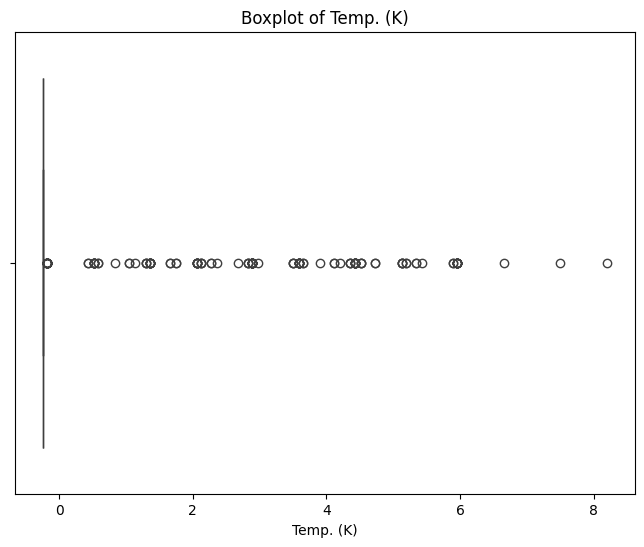

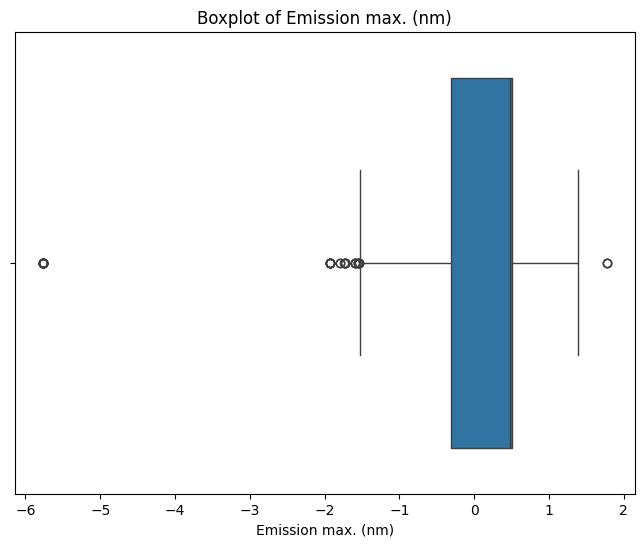

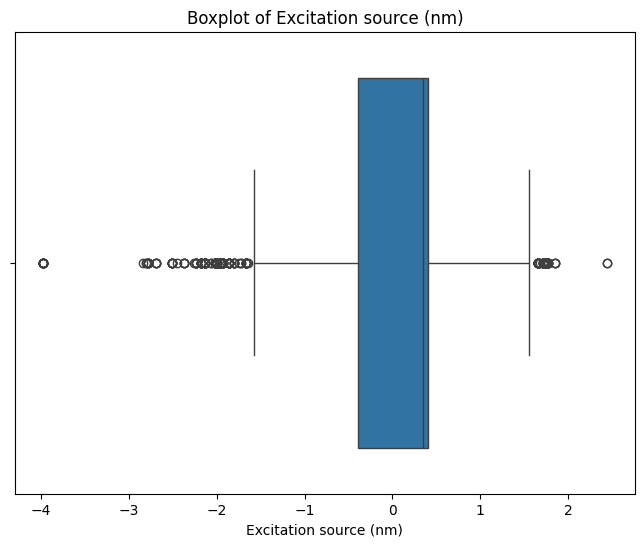

...

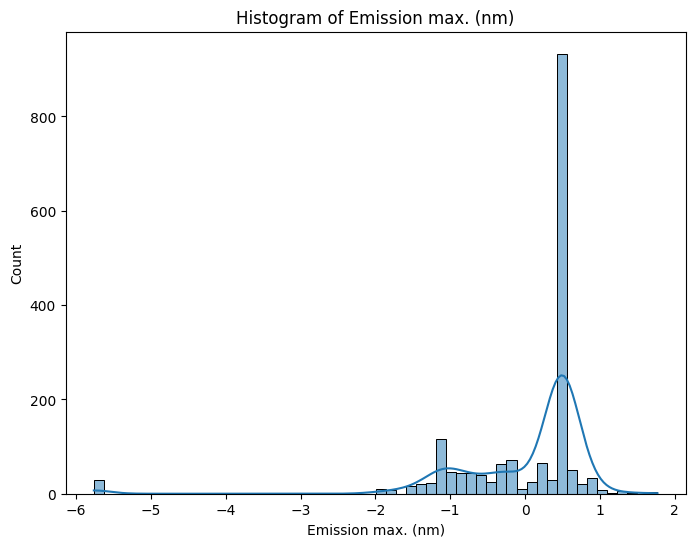

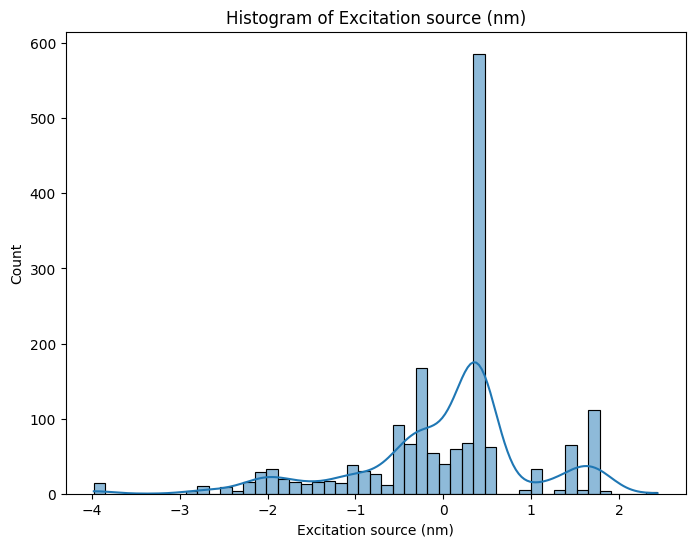

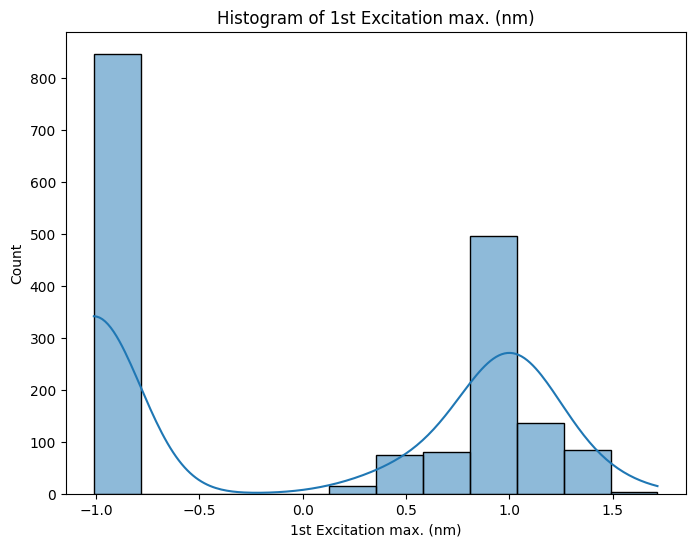

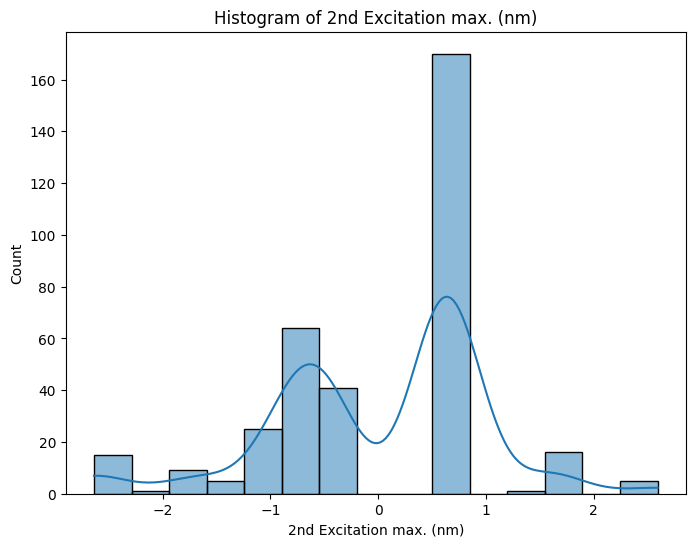

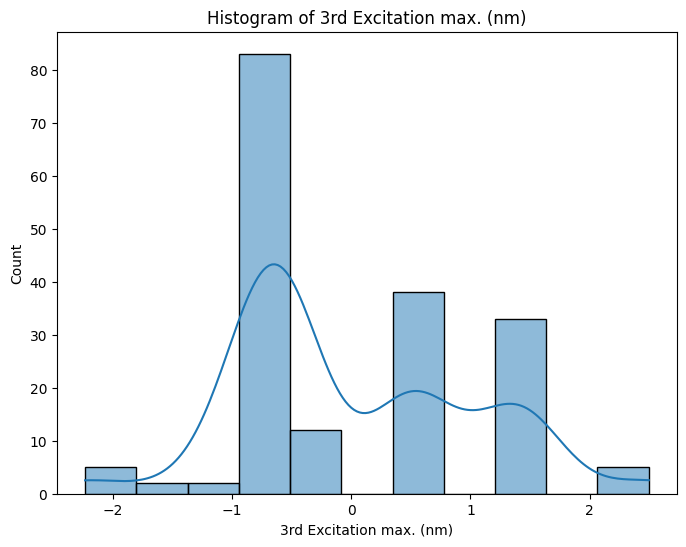

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# 绘制每个数值型特征的箱型图
for col in num_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

# 绘制每个数值型特征的直方图
for col in num_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')
    plt.show()


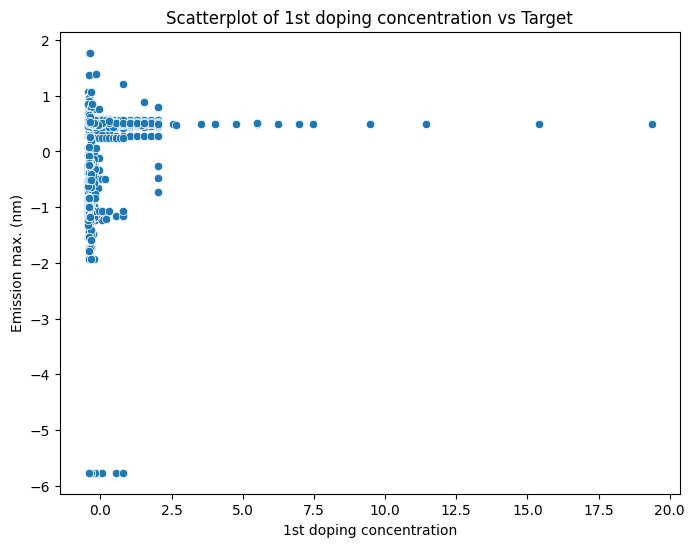

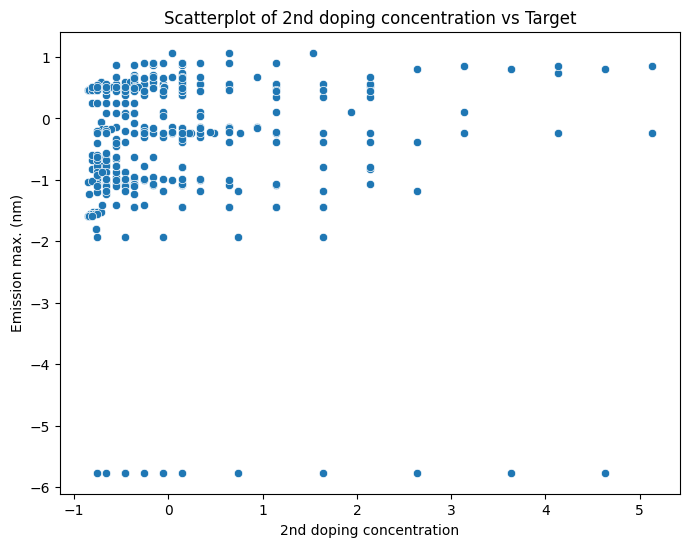

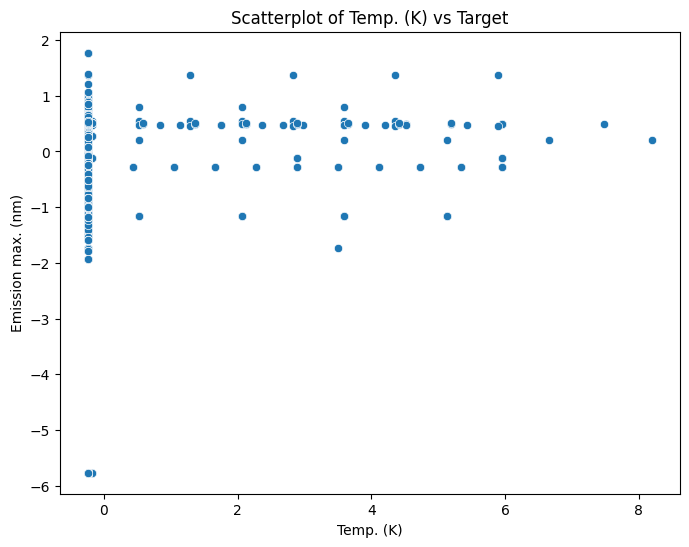

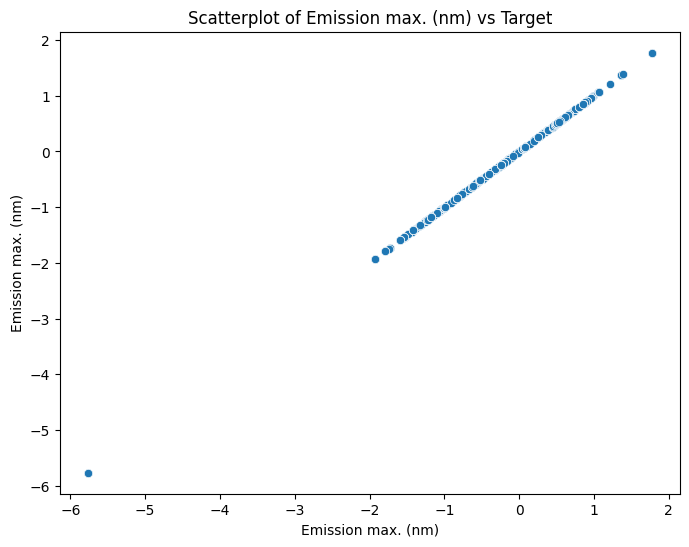

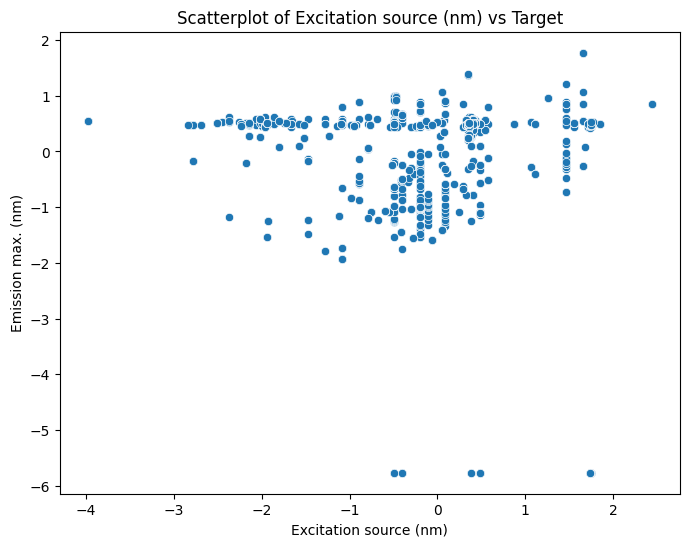

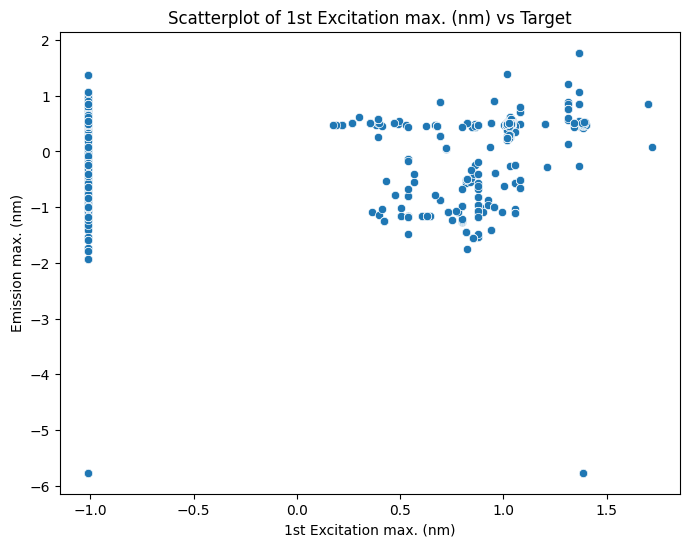

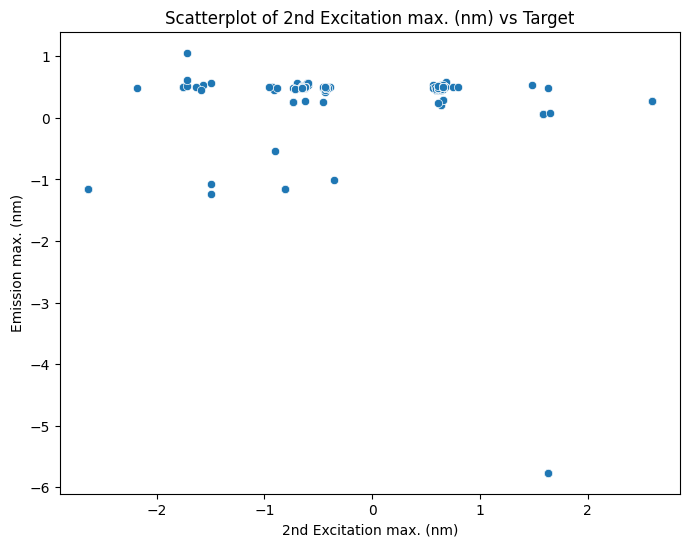

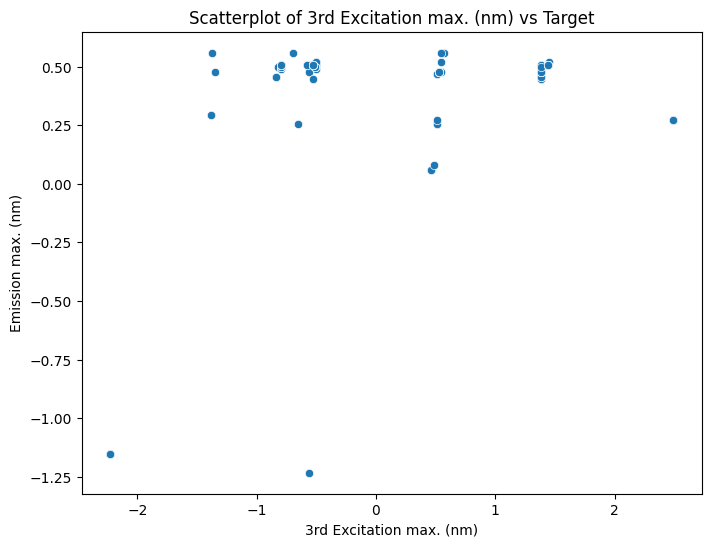

In [11]:
# 观察异常值与其他特征的关系
for col in num_columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df[col], y=df['Emission max. (nm)'])  # 假设 'target' 是目标变量
    plt.title(f'Scatterplot of {col} vs Target')
    plt.show()


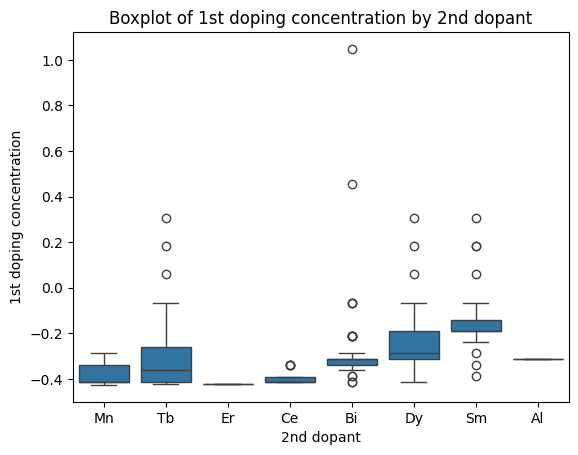

In [12]:
# 比如 '2nd dopant' 是一个分类变量
sns.boxplot(x='2nd dopant', y='1st doping concentration', data=df)
plt.title('Boxplot of 1st doping concentration by 2nd dopant')
plt.show()


/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_86462/1025080348.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


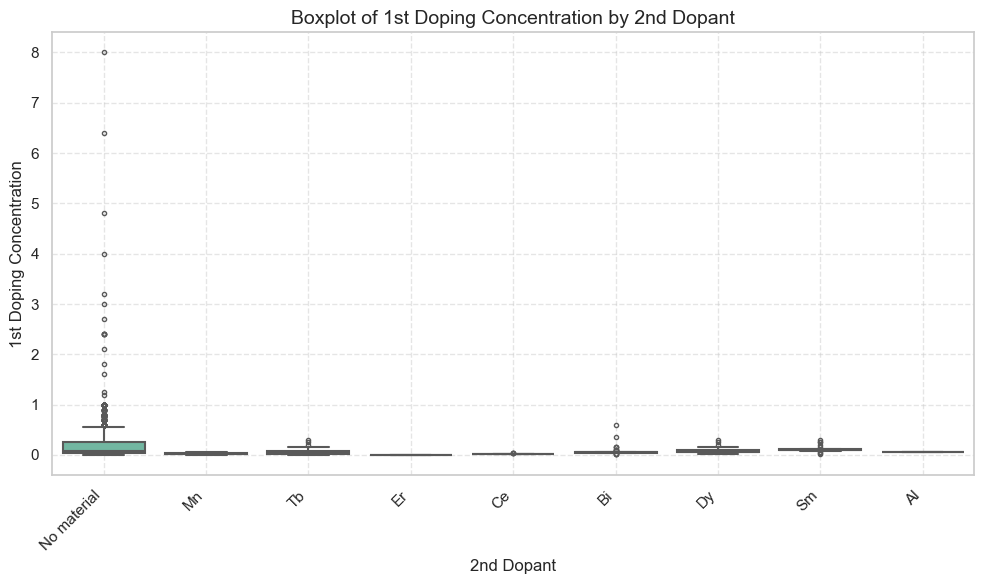

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))  # 设置图形尺寸
sns.set(style="whitegrid")   # 设置主题

sns.boxplot(
    x='2nd dopant', 
    y='1st doping concentration', 
    data=df,
    palette='Set2',           # 设定配色风格
    linewidth=1.5,            # 边框线宽
    fliersize=3               # 离群点大小
)

plt.title('Boxplot of 1st Doping Concentration by 2nd Dopant', fontsize=14)
plt.xlabel('2nd Dopant', fontsize=12)
plt.ylabel('1st Doping Concentration', fontsize=12)
plt.xticks(rotation=45, ha='right')  # x轴标签旋转以避免重叠
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_86462/3866342390.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


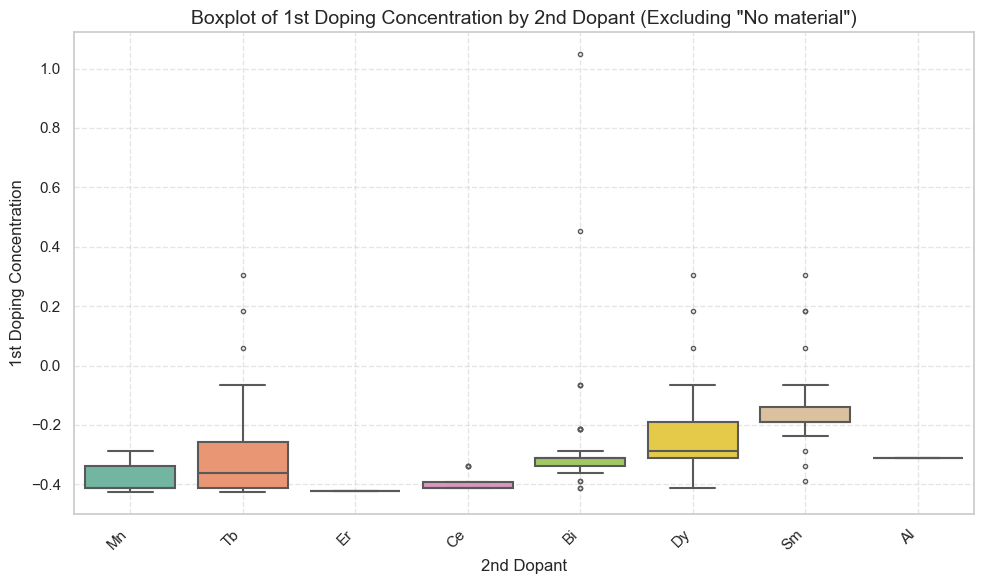

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

# 只在画图时排除“No material”
filtered_df = df[df['2nd dopant'] != 'No material']

sns.boxplot(
    x='2nd dopant', 
    y='1st doping concentration', #这个地方可以自己改，观察不同特征
    data=filtered_df,
    palette='Set2',
    linewidth=1.5,
    fliersize=3
)

plt.title('Boxplot of 1st Doping Concentration by 2nd Dopant (Excluding "No material")', fontsize=14)
plt.xlabel('2nd Dopant', fontsize=12)
plt.ylabel('1st Doping Concentration', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_86462/181636072.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


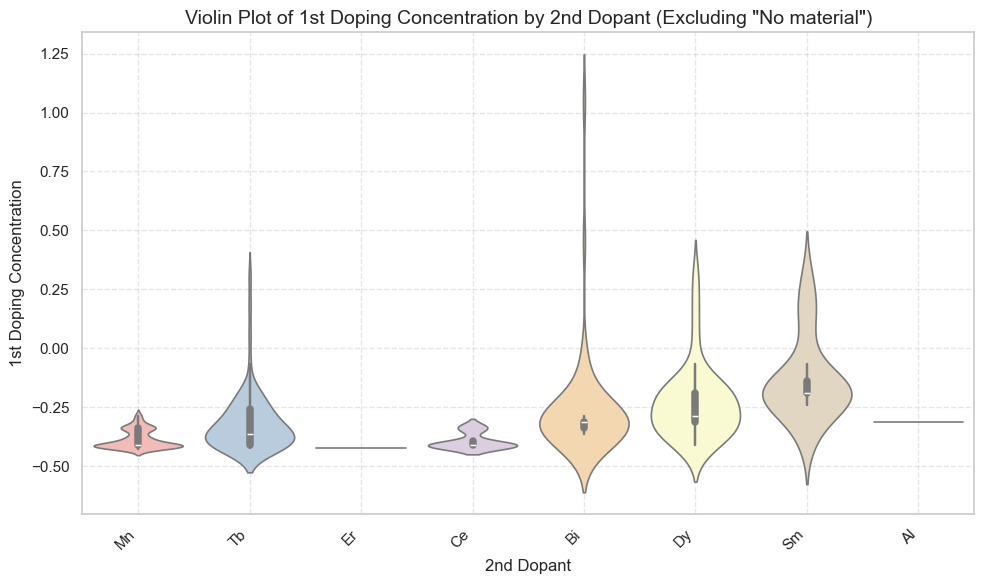

In [8]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

filtered_df = df[df['2nd dopant'] != 'No material']

sns.violinplot(
    x='2nd dopant', 
    y='1st doping concentration', 
    data=filtered_df,
    palette='Pastel1',
    inner='box',
    linewidth=1.2
)

plt.title('Violin Plot of 1st Doping Concentration by 2nd Dopant (Excluding "No material")', fontsize=14)
plt.xlabel('2nd Dopant', fontsize=12)
plt.ylabel('1st Doping Concentration', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [13]:
# 筛选出数值类型的列
num_columns = df.select_dtypes(include=['float64', 'int64']).columns

# 计算相关性矩阵
correlation_matrix = df[num_columns].corr()

target_correlation = correlation_matrix['Emission max. (nm)'].sort_values(ascending=False)
print(target_correlation)


Emission max. (nm)          1.000000
3rd Excitation max. (nm)    0.262911
1st doping concentration    0.153131
1st Excitation max. (nm)    0.117555
Excitation source (nm)      0.046541
Temp. (K)                   0.045101
2nd Excitation max. (nm)   -0.012762
2nd doping concentration   -0.051848
outlier_flag               -0.331178
Name: Emission max. (nm), dtype: float64


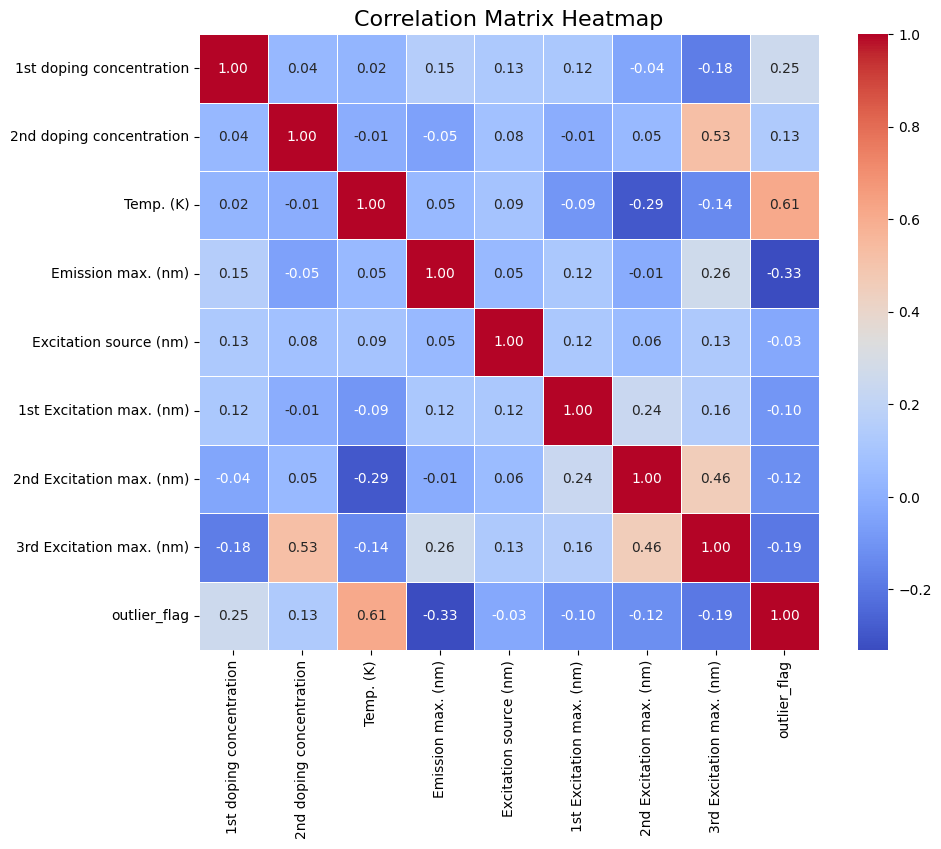

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# 筛选出数值类型的列
num_columns = df.select_dtypes(include=['float64', 'int64']).columns

# 计算相关性矩阵
correlation_matrix = df[num_columns].corr()

# 创建一个热图来展示相关性
plt.figure(figsize=(10, 8))  # 可以调整图的大小
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# 设置标题
plt.title('Correlation Matrix Heatmap', fontsize=16)

# 显示图形
plt.show()


1）X = df.drop(columns=['Emission max. (nm)','outlier_flag'])
y = df['Emission max. (nm)']；2）‘2nd dopant’是分类型变量，‘1st dopant valency_3’，‘2nd dopant valency_1.0’，‘2nd dopant valency_2.0’，‘2nd dopant valency_3.0’是布尔型变量

In [9]:
from sklearn.model_selection import train_test_split

# 数据拆分
X = df.drop(columns=['Emission max. (nm)', 'outlier_flag'])
y = df['Emission max. (nm)']



KeyError: "['outlier_flag'] not found in axis"

In [18]:
from sklearn.model_selection import train_test_split

# 数据拆分
X = df.drop(columns=['Emission max. (nm)'])
y = df['Emission max. (nm)']

In [19]:
# 对 '2nd dopant' 进行 one-hot 编码
X = pd.get_dummies(X, columns=['2nd dopant'], drop_first=True)


In [37]:

# 拆分为训练集和测试集，80%训练，20%测试
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [20]:
print(X.dtypes)


1st doping concentration    float64
2nd doping concentration    float64
Temp. (K)                   float64
Excitation source (nm)      float64
1st Excitation max. (nm)    float64
2nd Excitation max. (nm)    float64
3rd Excitation max. (nm)    float64
1st dopant valency_3           bool
2nd dopant valency_1.0         bool
2nd dopant valency_2.0         bool
2nd dopant valency_3.0         bool
2nd dopant_Bi                  bool
2nd dopant_Ce                  bool
2nd dopant_Dy                  bool
2nd dopant_Er                  bool
2nd dopant_Mn                  bool
2nd dopant_No material         bool
2nd dopant_Sm                  bool
2nd dopant_Tb                  bool
dtype: object


## 需求：用统计学分析看不同掺杂离子的浓度、温度、价态、激发波长与发射波长之间的关系

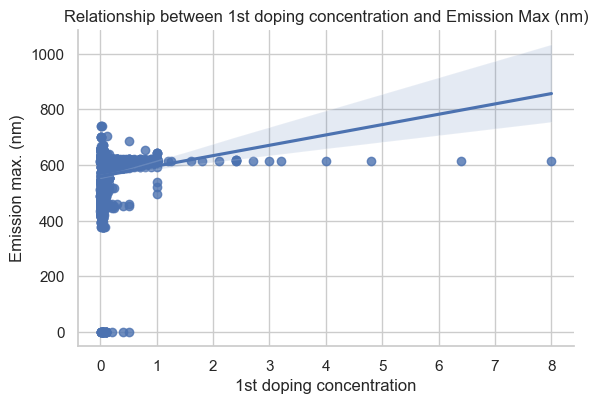

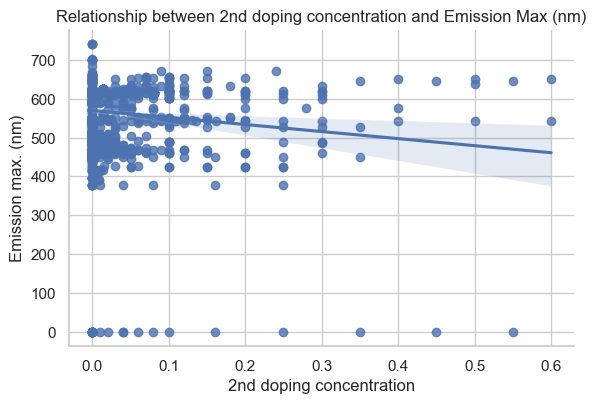

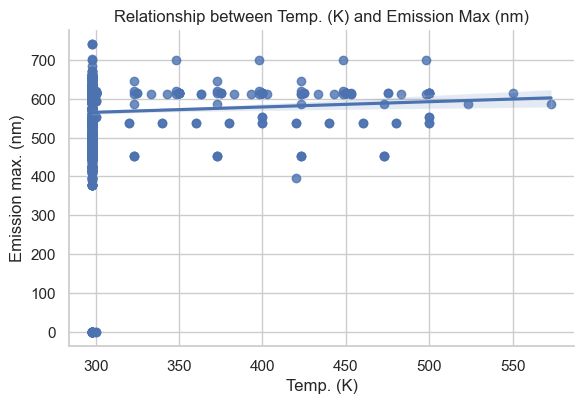

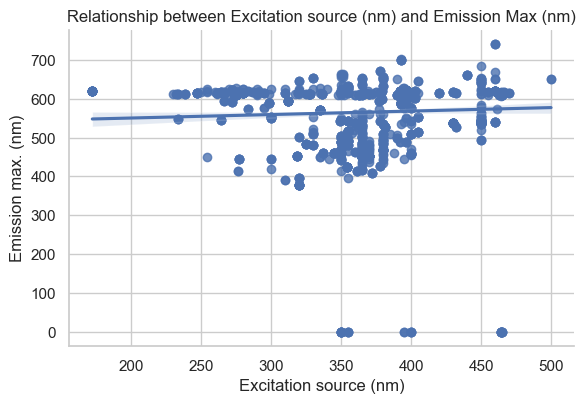

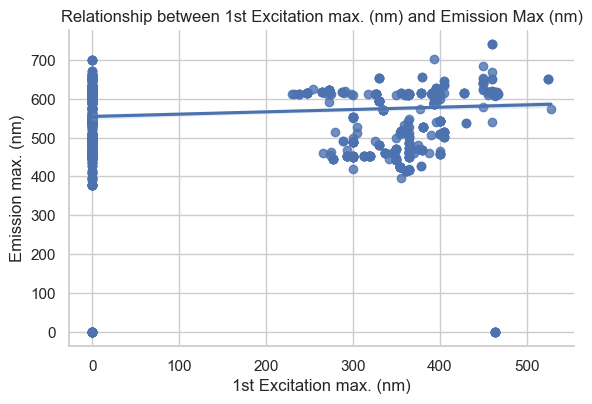

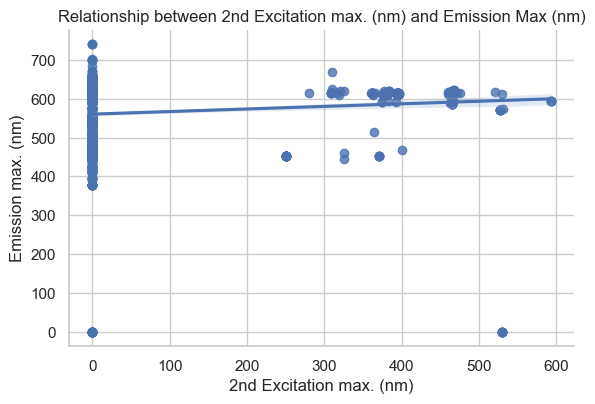

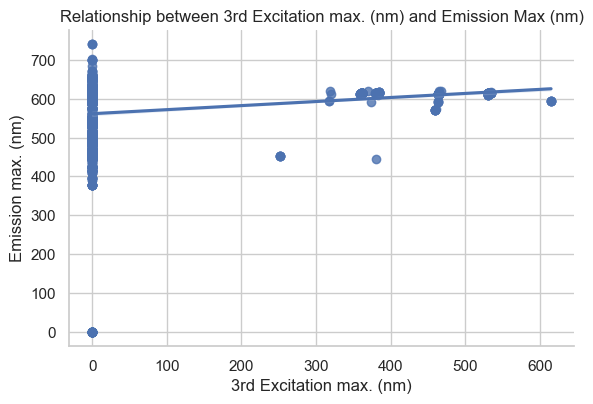

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# 连续变量与 y 的关系（散点 + 回归线）
cont_vars = ['1st doping concentration', '2nd doping concentration', 'Temp. (K)', 
             'Excitation source (nm)', '1st Excitation max. (nm)', 
             '2nd Excitation max. (nm)', '3rd Excitation max. (nm)']

for var in cont_vars:
    sns.lmplot(x=var, y='Emission max. (nm)', data=df, height=4, aspect=1.5)
    plt.title(f'Relationship between {var} and Emission Max (nm)')
    plt.show()


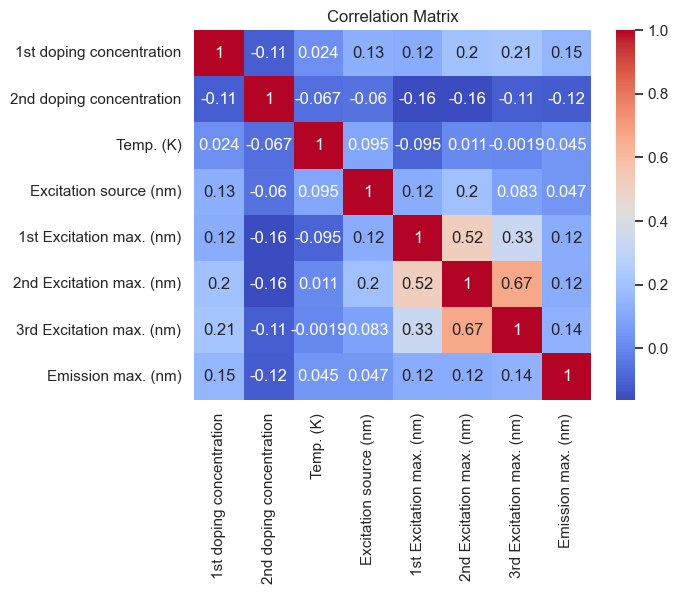

In [22]:
corr_matrix = df[cont_vars + ['Emission max. (nm)']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()


In [23]:
import statsmodels.api as sm

X = df.drop(columns='Emission max. (nm)')
y = df['Emission max. (nm)']

# 添加常数项
X_const = sm.add_constant(X)
model = sm.OLS(y, X_const).fit()

# 查看回归结果摘要
print(model.summary())


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [26]:
# 识别非数值列
non_numeric_cols = X.select_dtypes(include='object').columns
print("非数值列:", non_numeric_cols)

# 针对 "No material" 情况，手动转换为布尔型
for col in non_numeric_cols:
    print(f"示例值 {col}: {X[col].unique()}")
    X[col] = X[col].apply(lambda x: x == "No material" or x == True)

# 再进行强制转换为 float
X_numeric = X.apply(pd.to_numeric)
X_const = sm.add_constant(X_numeric)
model = sm.OLS(y, X_const).fit()
print(model.summary())


非数值列: Index(['2nd dopant'], dtype='object')
示例值 2nd dopant: ['No material' 'Mn' 'Tb' 'Er' 'Ce' 'Bi' 'Dy' 'Sm' 'Al']


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [27]:
# 查看数据类型
print("X 数据类型：")
print(X.dtypes)

print("\ny 数据类型：")
print(y.dtype)


X 数据类型：
1st doping concentration    float64
2nd dopant                     bool
2nd doping concentration    float64
Temp. (K)                   float64
Excitation source (nm)      float64
1st Excitation max. (nm)    float64
2nd Excitation max. (nm)    float64
3rd Excitation max. (nm)    float64
1st dopant valency_3           bool
2nd dopant valency_1.0         bool
2nd dopant valency_2.0         bool
2nd dopant valency_3.0         bool
dtype: object

y 数据类型：
float64


In [28]:
import statsmodels.api as sm
import numpy as np

# 将布尔值统一转为 0.0 和 1.0，再转换为 numpy float64 类型
X_numeric = X.astype(float)
X_const = sm.add_constant(X_numeric)

# y 也确保是 numpy 数组格式，float64 类型
y_numeric = np.asarray(y).astype(float)

# 拟合 OLS 模型
model = sm.OLS(y_numeric, X_const).fit()
print(model.summary())



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.195
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     38.06
Date:                Wed, 09 Apr 2025   Prob (F-statistic):           8.14e-74
Time:                        08:25:52   Log-Likelihood:                -10261.
No. Observations:                1740   AIC:                         2.055e+04
Df Residuals:                    1728   BIC:                         2.061e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [24]:
import scipy.stats as stats

for col in df.columns:
    if df[col].dtype == 'bool':
        group1 = df[df[col]]['Emission max. (nm)']
        group2 = df[~df[col]]['Emission max. (nm)']
        stat, p = stats.ttest_ind(group1, group2, equal_var=False)
        print(f'{col}: p-value={p:.4f}')


1st dopant valency_3: p-value=0.0000
2nd dopant valency_1.0: p-value=nan
2nd dopant valency_2.0: p-value=0.0000
2nd dopant valency_3.0: p-value=0.0658


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1113: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1113: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


XGBoost R²: 0.5673
XGBoost MAE: 25.6213
XGBoost RMSE: 62.5584


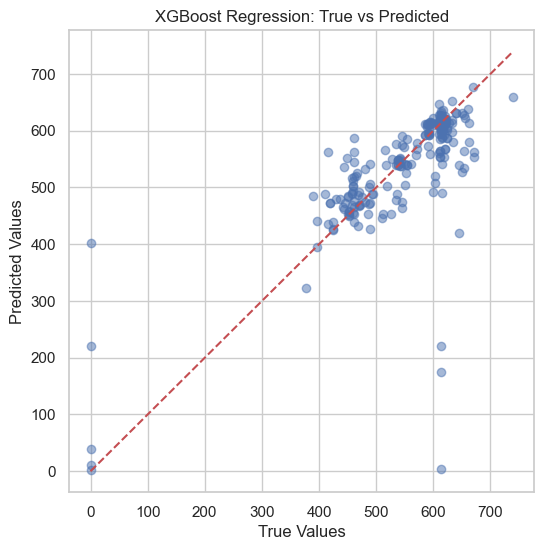

In [29]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# 拆分数据集
X_train, X_test, y_train, y_test = train_test_split(X_numeric, y, test_size=0.2, random_state=42)

# 建模
xgb_model = XGBRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)

# 预测
y_pred = xgb_model.predict(X_test)

# 评估指标
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"XGBoost R²: {r2:.4f}")
print(f"XGBoost MAE: {mae:.4f}")
print(f"XGBoost RMSE: {rmse:.4f}")

# 真实 vs 预测图
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("XGBoost Regression: True vs Predicted")
plt.grid(True)
plt.show()


CatBoost R²: 0.6009
CatBoost MAE: 26.3129
CatBoost RMSE: 60.0745


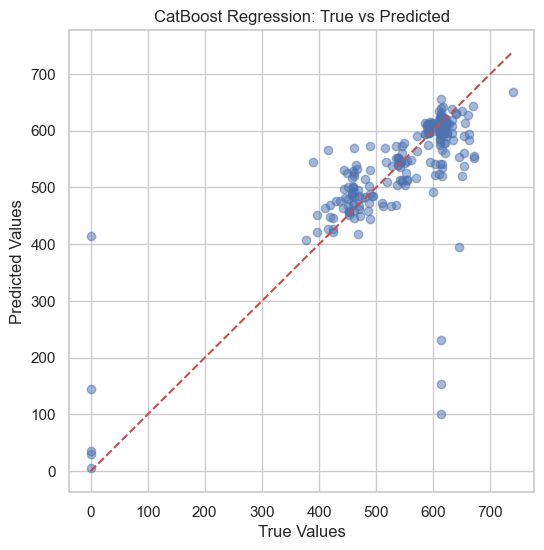

In [30]:
from catboost import CatBoostRegressor

# 建模（silent=True关闭输出）
cat_model = CatBoostRegressor(iterations=500, learning_rate=0.1, depth=5, random_state=42, verbose=0)
cat_model.fit(X_train, y_train)

# 预测
y_pred_cat = cat_model.predict(X_test)

# 评估指标
r2_cat = r2_score(y_test, y_pred_cat)
mae_cat = mean_absolute_error(y_test, y_pred_cat)
rmse_cat = np.sqrt(mean_squared_error(y_test, y_pred_cat))

print(f"CatBoost R²: {r2_cat:.4f}")
print(f"CatBoost MAE: {mae_cat:.4f}")
print(f"CatBoost RMSE: {rmse_cat:.4f}")

# 可视化对比图
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred_cat, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("CatBoost Regression: True vs Predicted")
plt.grid(True)
plt.show()


In [32]:
from catboost import CatBoostRegressor

model = CatBoostRegressor()
model.fit(X_train, y_train)


Learning rate set to 0.043139
0:	learn: 97.5156249	total: 1.37ms	remaining: 1.37s
1:	learn: 96.1885536	total: 1.84ms	remaining: 917ms
2:	learn: 94.7953314	total: 2.35ms	remaining: 781ms
3:	learn: 93.6065963	total: 3.66ms	remaining: 910ms
4:	learn: 92.4753047	total: 4.42ms	remaining: 880ms
5:	learn: 91.4654594	total: 4.92ms	remaining: 815ms
6:	learn: 90.4732452	total: 5.53ms	remaining: 785ms
7:	learn: 89.6086025	total: 6.03ms	remaining: 747ms
8:	learn: 88.6640382	total: 6.46ms	remaining: 711ms
9:	learn: 87.7969975	total: 6.96ms	remaining: 690ms
10:	learn: 87.1124209	total: 7.47ms	remaining: 672ms
11:	learn: 86.7891342	total: 7.71ms	remaining: 635ms
12:	learn: 86.1919130	total: 8.23ms	remaining: 625ms
13:	learn: 85.3691608	total: 8.71ms	remaining: 613ms
14:	learn: 84.5504121	total: 9.36ms	remaining: 614ms
15:	learn: 83.9701229	total: 9.79ms	remaining: 602ms
16:	learn: 83.4159336	total: 10.4ms	remaining: 604ms
17:	learn: 82.8671536	total: 11.2ms	remaining: 609ms
18:	learn: 82.3495822	tota

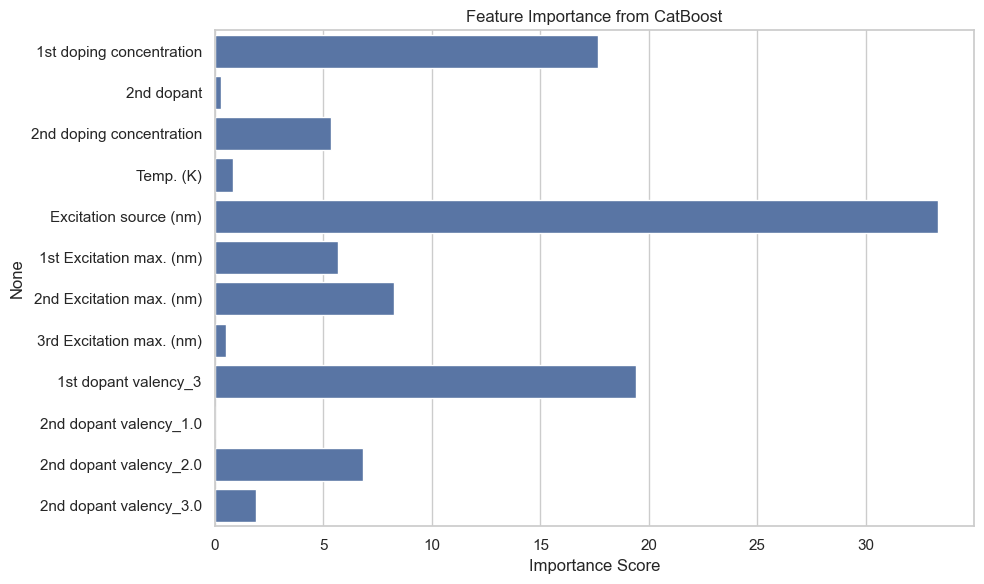

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

feature_importances = model.get_feature_importance()
feature_names = X.columns

plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances, y=feature_names)
plt.title("Feature Importance from CatBoost")
plt.xlabel("Importance Score")
plt.tight_layout()
plt.show()


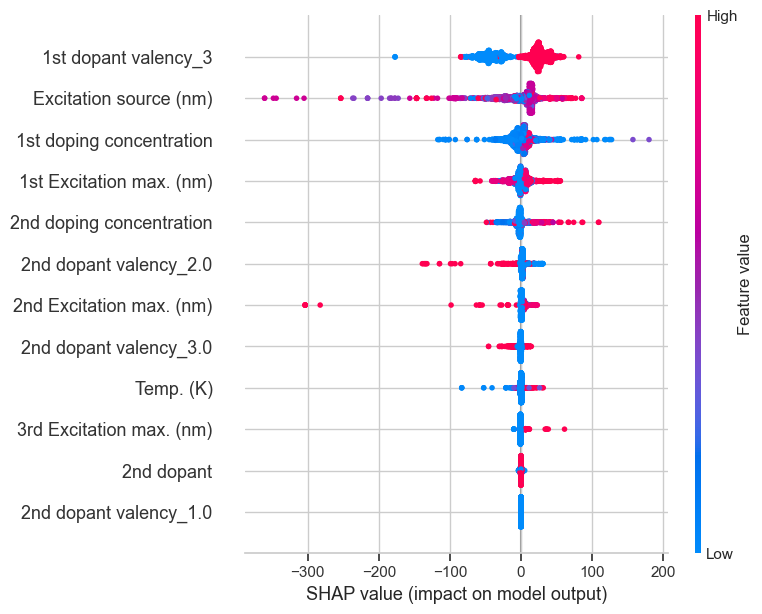

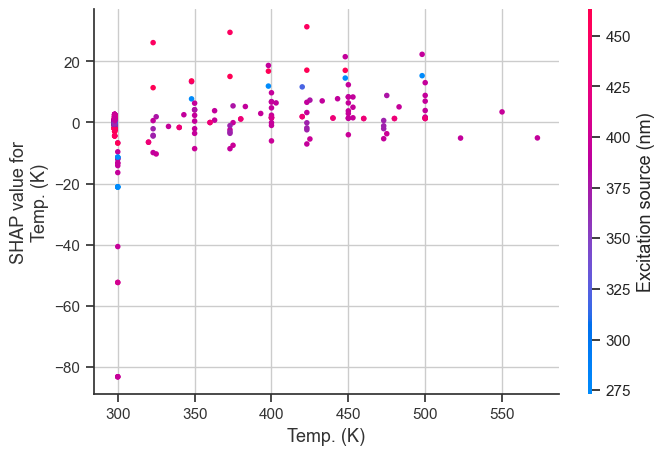

In [34]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# 总体特征作用可视化
shap.summary_plot(shap_values, X)

# 单个特征详细作用图
shap.dependence_plot("Temp. (K)", shap_values, X)  # 你也可以替换成其他变量名


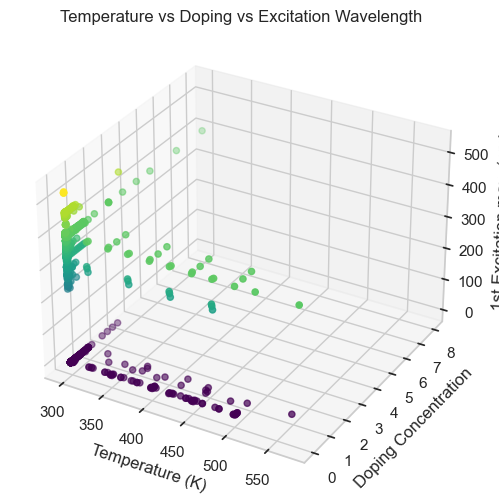

In [35]:
#3D曲线图列名可改

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import numpy as np


x = df['Temp. (K)']
y = df['1st doping concentration']
z = df['1st Excitation max. (nm)']

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x, y, z, c=z, cmap='viridis')
ax.set_xlabel('Temperature (K)')
ax.set_ylabel('Doping Concentration')
ax.set_zlabel('1st Excitation max. (nm)')
plt.title("Temperature vs Doping vs Excitation Wavelength")
plt.show()


In [41]:
import numpy as np
import pandas as pd

# 替换非数值型错误项为 np.nan
df_cleaned = df.copy()
df_cleaned.replace("No material", np.nan, inplace=True)

# 将所有特征转为数值，无法转换的强制设为 NaN
df_cleaned = df_cleaned.apply(pd.to_numeric, errors='coerce')

# 删除存在 NaN 的行（也可考虑填充）
df_cleaned.dropna(inplace=True)

# 保证与训练模型时一致的特征列
z = model.predict(df_cleaned[X.columns])


No objects info loaded


In [43]:
# 查看每列中非数字类型的异常值
for col in df.columns:
    non_numeric = df[col][~df[col].apply(lambda x: isinstance(x, (int, float, np.number)))]
    if not non_numeric.empty:
        print(f"{col} 中的非数值数据：\n", non_numeric.unique())


2nd dopant 中的非数值数据：
 ['No material' 'Mn' 'Tb' 'Er' 'Ce' 'Bi' 'Dy' 'Sm' 'Al']


In [44]:
df_cleaned = df.drop(columns=["2nd dopant"])


In [47]:
# 将其他非数值列也统一转换为数值（如有）
df_cleaned = df_cleaned.apply(pd.to_numeric, errors='coerce')
df_cleaned.dropna(inplace=True)


In [52]:
# 设定目标列名称
target_column = 'Emission max. (nm)'

# 从 df_cleaned 中删除目标列，得到特征列 X
X = df_cleaned.drop(columns=[target_column])

# 目标列 y
y = df_cleaned[target_column]


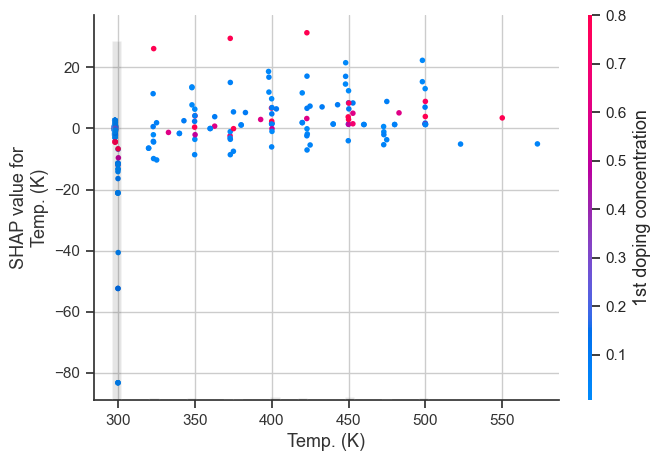

In [37]:
import shap

# 创建 SHAP explainer
explainer = shap.Explainer(model)
shap_values = explainer(X)

# 交互图：看“温度”和“1st doping concentration”的交互
shap.plots.scatter(
    shap_values[:, "Temp. (K)"],
    color=shap_values[:, "1st doping concentration"]
)


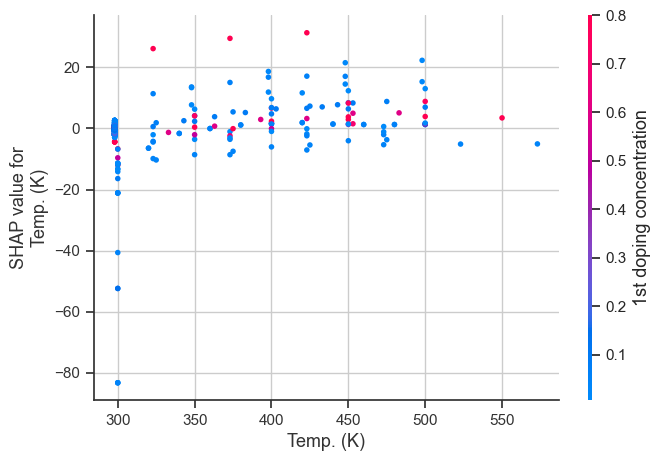

In [38]:
shap.dependence_plot("Temp. (K)", shap_values.values, X, interaction_index="1st doping concentration")


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 28201 (\N{CJK UNIFIED IDEOGRAPH-6E29}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 28608 (\N{CJK UNIFIED IDEOGRAPH-6FC0}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 21457 (\N{CJK UNIFIED IDEOGRAPH-53D1}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/IPython/core/py

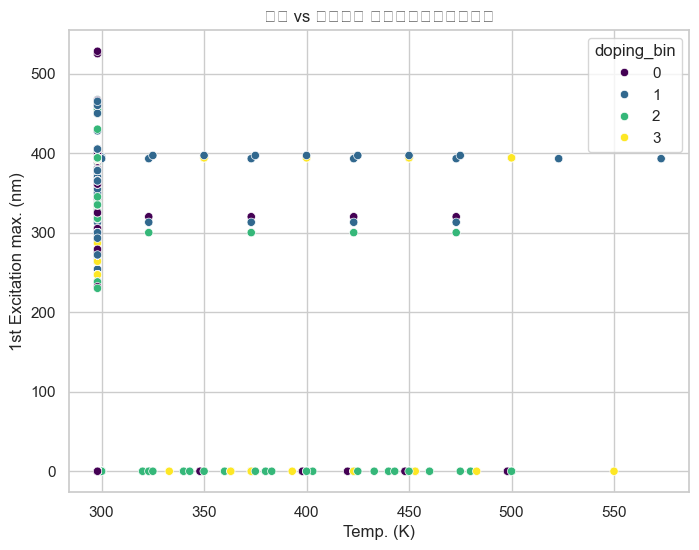

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# 以 1st doping concentration 分箱观察 Temp 和 Excitation 关系
df['doping_bin'] = pd.qcut(df['1st doping concentration'], q=4, labels=False)

plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x="Temp. (K)", y="1st Excitation max. (nm)", hue="doping_bin", palette="viridis")
plt.title("温度 vs 激发波长 不同掺杂浓度下的表现")
plt.show()


In [39]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


# 线性回归模型
model = LinearRegression()

# 训练模型
model.fit(X_train, y_train)

# 预测
y_pred = model.predict(X_test)

# 评估模型
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R2 Score: {r2}")


Mean Squared Error: 0.7546563417022883
R2 Score: 0.19541514663591308


In [61]:
from sklearn.ensemble import RandomForestRegressor

# 随机森林回归模型
rf_model = RandomForestRegressor(random_state=42)

# 训练模型
rf_model.fit(X_train, y_train)

# 预测
y_pred_rf = rf_model.predict(X_test)

# 评估模型
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest - Mean Squared Error: {mse_rf}")
print(f"Random Forest - R2 Score: {r2_rf}")


Random Forest - Mean Squared Error: 0.4641254077967326
Random Forest - R2 Score: 0.5051677796381675


In [62]:
from sklearn.ensemble import GradientBoostingRegressor

# 梯度提升回归模型
gb_model = GradientBoostingRegressor(random_state=42)

# 训练模型
gb_model.fit(X_train, y_train)

# 预测
y_pred_gb = gb_model.predict(X_test)

# 评估模型
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print(f"Gradient Boosting - Mean Squared Error: {mse_gb}")
print(f"Gradient Boosting - R2 Score: {r2_gb}")


Gradient Boosting - Mean Squared Error: 0.5548830685934043
Gradient Boosting - R2 Score: 0.4084055381137135


In [63]:
from sklearn.svm import SVR

# 支持向量机回归模型
svr_model = SVR(kernel='rbf')

# 训练模型
svr_model.fit(X_train, y_train)

# 预测
y_pred_svr = svr_model.predict(X_test)

# 评估模型
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

print(f"Support Vector Regression - Mean Squared Error: {mse_svr}")
print(f"Support Vector Regression - R2 Score: {r2_svr}")


Support Vector Regression - Mean Squared Error: 0.7072993024949975
Support Vector Regression - R2 Score: 0.24590535567650296


In [64]:
from sklearn.neighbors import KNeighborsRegressor

# K 最近邻回归模型
knn_model = KNeighborsRegressor(n_neighbors=5)

# 训练模型
knn_model.fit(X_train, y_train)

# 预测
y_pred_knn = knn_model.predict(X_test)

# 评估模型
mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f"K-Nearest Neighbors - Mean Squared Error: {mse_knn}")
print(f"K-Nearest Neighbors - R2 Score: {r2_knn}")


K-Nearest Neighbors - Mean Squared Error: 0.5956742876220461
K-Nearest Neighbors - R2 Score: 0.36491554781340063


In [65]:
from xgboost import XGBRegressor

# XGBoost 回归模型
xgb_model = XGBRegressor(random_state=42)

# 训练模型
xgb_model.fit(X_train, y_train)

# 预测
y_pred_xgb = xgb_model.predict(X_test)

# 评估模型
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"XGBoost - Mean Squared Error: {mse_xgb}")
print(f"XGBoost - R2 Score: {r2_xgb}")


XGBoost - Mean Squared Error: 0.4275026142533557
XGBoost - R2 Score: 0.5442135589480106


In [66]:
from sklearn.tree import DecisionTreeRegressor

# 决策树回归模型
dt_model = DecisionTreeRegressor(random_state=42)

# 训练模型
dt_model.fit(X_train, y_train)

# 预测
y_pred_dt = dt_model.predict(X_test)

# 评估模型
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print(f"Decision Tree - Mean Squared Error: {mse_dt}")
print(f"Decision Tree - R2 Score: {r2_dt}")


Decision Tree - Mean Squared Error: 0.6033100413347057
Decision Tree - R2 Score: 0.356774608101205


In [67]:
from sklearn.linear_model import Lasso

# Lasso回归模型
lasso_model = Lasso(alpha=0.1)

# 训练模型
lasso_model.fit(X_train, y_train)

# 预测
y_pred_lasso = lasso_model.predict(X_test)

# 评估模型
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

print(f"Lasso Regression - Mean Squared Error: {mse_lasso}")
print(f"Lasso Regression - R2 Score: {r2_lasso}")


Lasso Regression - Mean Squared Error: 0.8084955475705862
Lasso Regression - R2 Score: 0.13801390693908655


In [68]:
from sklearn.linear_model import Ridge

# Ridge回归模型
ridge_model = Ridge(alpha=0.1)

# 训练模型
ridge_model.fit(X_train, y_train)

# 预测
y_pred_ridge = ridge_model.predict(X_test)

# 评估模型
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

print(f"Ridge Regression - Mean Squared Error: {mse_ridge}")
print(f"Ridge Regression - R2 Score: {r2_ridge}")


Ridge Regression - Mean Squared Error: 0.7546963854435462
Ridge Regression - R2 Score: 0.19537245357695665


In [69]:
from sklearn.linear_model import ElasticNet

# ElasticNet回归模型
elasticnet_model = ElasticNet(alpha=0.1, l1_ratio=0.5)

# 训练模型
elasticnet_model.fit(X_train, y_train)

# 预测
y_pred_elasticnet = elasticnet_model.predict(X_test)

# 评估模型
mse_elasticnet = mean_squared_error(y_test, y_pred_elasticnet)
r2_elasticnet = r2_score(y_test, y_pred_elasticnet)

print(f"ElasticNet Regression - Mean Squared Error: {mse_elasticnet}")
print(f"ElasticNet Regression - R2 Score: {r2_elasticnet}")


ElasticNet Regression - Mean Squared Error: 0.7901611458274524
ElasticNet Regression - R2 Score: 0.15756132358802388


In [70]:
from sklearn.neighbors import KNeighborsRegressor

# K近邻回归模型
knn_model = KNeighborsRegressor(n_neighbors=5)

# 训练模型
knn_model.fit(X_train, y_train)

# 预测
y_pred_knn = knn_model.predict(X_test)

# 评估模型
mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f"K-Nearest Neighbors - Mean Squared Error: {mse_knn}")
print(f"K-Nearest Neighbors - R2 Score: {r2_knn}")


K-Nearest Neighbors - Mean Squared Error: 0.5956742876220461
K-Nearest Neighbors - R2 Score: 0.36491554781340063


In [72]:
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 更新后的分类变量：One-Hot 编码后的分类列名
cat_features = [
    '2nd dopant_Bi', '2nd dopant_Ce', '2nd dopant_Dy', '2nd dopant_Er', 
    '2nd dopant_Mn', '2nd dopant_No material', '2nd dopant_Sm', '2nd dopant_Tb'
]



# CatBoost回归模型
catboost_model = CatBoostRegressor(iterations=1000,  # 迭代次数
                                   learning_rate=0.1,  # 学习率
                                   depth=6,  # 树的深度
                                   cat_features=cat_features,  # 分类变量列
                                   verbose=200)  # 每200次输出一次训练信息

# 训练模型
catboost_model.fit(X_train, y_train)

# 预测
y_pred_catboost = catboost_model.predict(X_test)

# 评估模型
mse_catboost = mean_squared_error(y_test, y_pred_catboost)
r2_catboost = r2_score(y_test, y_pred_catboost)

print(f"CatBoost Regression - Mean Squared Error: {mse_catboost}")
print(f"CatBoost Regression - R2 Score: {r2_catboost}")


0:	learn: 0.9755948	total: 58.2ms	remaining: 58.2s
200:	learn: 0.3680590	total: 139ms	remaining: 551ms
400:	learn: 0.2906424	total: 221ms	remaining: 330ms
600:	learn: 0.2595869	total: 302ms	remaining: 201ms
800:	learn: 0.2421376	total: 381ms	remaining: 94.7ms
999:	learn: 0.2310134	total: 460ms	remaining: 0us
CatBoost Regression - Mean Squared Error: 0.3370891917684202
CatBoost Regression - R2 Score: 0.6406087871496243


In [75]:
#  X_train_cnn 中有一些无法转换为 Tensor 的数据类型（例如，存在一些非数字类型的元素或者是空值）。转换为数值类型
X_train = X_train.astype(float)
X_test = X_test.astype(float)


In [76]:
print(X_train.shape)  # 确保数据的形状是 (样本数, 特征数)
print(X_test.shape)   # 同样检查测试数据的形状

# 如果数据不是数值型或缺失值仍然存在，可以尝试以下的转换操作
X_train_cnn = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test_cnn = X_test.values.reshape(-1, X_test.shape[1], 1)


(1392, 19)
(348, 19)


In [77]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.metrics import mean_squared_error, r2_score

# 定义模型
cnn_model = Sequential()

# 添加卷积层（适用于一维数据）
cnn_model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
cnn_model.add(MaxPooling1D(pool_size=2))
cnn_model.add(Flatten())

# 添加全连接层
cnn_model.add(Dense(64, activation='relu'))
cnn_model.add(Dense(1))  # 输出层，回归问题

# 编译模型
cnn_model.compile(optimizer='adam', loss='mse')

# 重新调整输入形状 (使其符合 CNN 的要求)
X_train_cnn = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test_cnn = X_test.values.reshape(-1, X_test.shape[1], 1)

# 训练模型
cnn_model.fit(X_train_cnn, y_train, epochs=50, batch_size=32, verbose=1)

# 预测
y_pred_cnn = cnn_model.predict(X_test_cnn)

# 评估模型
mse_cnn = mean_squared_error(y_test, y_pred_cnn)
r2_cnn = r2_score(y_test, y_pred_cnn)

print(f"CNN - Mean Squared Error: {mse_cnn}")
print(f"CNN - R2 Score: {r2_cnn}")


Epoch 1/50


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.8135 
Epoch 2/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.6076
Epoch 3/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.7216
Epoch 4/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.7844
Epoch 5/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.7841
Epoch 6/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.7131
Epoch 7/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 684us/step - loss: 0.7522
Epoch 8/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.7627
Epoch 9/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 655us/step - loss: 0.7276
Epoch 10/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.7948
Epoch 11/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - loss: 0.6860
Epoch 12/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - loss: 0.7087
Epoch 13/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 649us/step - loss: 0.8696
Epoch 14/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.7313
Epoch 15/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 649us/step - loss: 0.6845

In [78]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from sklearn.metrics import mean_squared_error, r2_score

# 定义模型
rnn_model = Sequential()

# 添加 RNN 层
rnn_model.add(SimpleRNN(64, activation='relu', input_shape=(X_train.shape[1], 1)))

# 添加全连接层
rnn_model.add(Dense(64, activation='relu'))
rnn_model.add(Dense(1))  # 输出层，回归问题

# 编译模型
rnn_model.compile(optimizer='adam', loss='mse')

# 重新调整输入形状
X_train_rnn = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test_rnn = X_test.values.reshape(-1, X_test.shape[1], 1)

# 训练模型
rnn_model.fit(X_train_rnn, y_train, epochs=50, batch_size=32, verbose=1)

# 预测
y_pred_rnn = rnn_model.predict(X_test_rnn)

# 评估模型
mse_rnn = mean_squared_error(y_test, y_pred_rnn)
r2_rnn = r2_score(y_test, y_pred_rnn)

print(f"RNN - Mean Squared Error: {mse_rnn}")
print(f"RNN - R2 Score: {r2_rnn}")



Epoch 1/50


/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8896  
Epoch 2/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9605
Epoch 3/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6489
Epoch 4/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7200
Epoch 5/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7436
Epoch 6/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6845
Epoch 7/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6258
Epoch 8/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8072
Epoch 9/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7269
Epoch 10/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8378
Epoch 11/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6146
Epoch 12/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7625
Epoch 13/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7174
Epoch 14/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7391
Epoch 15/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5336
Epoch 16/50
44/44 ━━━━━━━━━━

In [81]:
from tensorflow.keras.optimizers import Adam

# 设置 Adam 优化器，调整学习率等超参数
optimizer = Adam(learning_rate=0.0002, beta_1=0.5)


In [82]:
discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])


In [83]:
discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])


In [84]:
generator.compile(optimizer=optimizer)


In [86]:
real_data = np.array(real_data)
fake_data = np.array(fake_data)

# 确保它们是二维数组
print(real_data.shape)  # 应该是 (batch_size, input_dim)
print(fake_data.shape)  # 应该是 (batch_size, input_dim)


(32, 19)
(32, 1)


In [87]:
real_labels = np.ones((batch_size, 1))   # 标签为 1，表示真实数据
fake_labels = np.zeros((batch_size, 1))  # 标签为 0，表示假数据


In [88]:
real_data = real_data.astype(np.float32)
fake_data = fake_data.astype(np.float32)


In [89]:
print(real_data.shape, fake_data.shape)
print(real_labels.shape, fake_labels.shape)


(32, 19) (32, 1)
(64, 1) (64, 1)


real_data 和 fake_data 的形状是 (32, 19)，这是正确的，因为你有 19 个特征。
但是，real_labels 和 fake_labels 的形状是 (64, 1)，这表明标签的数量不匹配。每个批次的标签应该与每个样本的数量一致，因此在这里，real_labels 和 fake_labels 应该有 32 行，而不是 64 行。

In [90]:
real_labels = np.ones((32, 1))  # 标签为 1，表示真实数据
fake_labels = np.zeros((32, 1))  # 标签为 0，表示假数据


In [91]:
d_loss_real = discriminator.train_on_batch(real_data, real_labels)
d_loss_fake = discriminator.train_on_batch(fake_data, fake_labels)


ValueError: Dimensions must be equal, but are 1 and 19 for '{{node sequential_4_1/dense_9_1/MatMul}} = MatMul[T=DT_FLOAT, grad_a=false, grad_b=false, transpose_a=false, transpose_b=false](data, sequential_4_1/dense_9_1/Cast/ReadVariableOp)' with input shapes: [32,1], [19,64].

In [94]:
print(fake_data.shape)
print(real_data.shape)


(32, 1)
(32, 19)


In [95]:
import numpy as np

# 查看数据形状
print("Fake data shape:", fake_data.shape)
print("Real data shape:", real_data.shape)

# 如果数据不匹配，可以尝试调整
if fake_data.shape[0] == 32:  # 如果只有32个样本
    fake_data = np.random.randn(32, 19)  # 使用随机数据或其他合适的方式
    real_data = np.random.randn(32, 19)  # 使用随机数据或其他合适的方式

# 确保数据是 float32 类型
fake_data = fake_data.astype(np.float32)
real_data = real_data.astype(np.float32)


Fake data shape: (32, 1)
Real data shape: (32, 19)


In [96]:
import numpy as np

# 假设 real_data 和 fake_data 的形状
real_data = np.random.randn(32, 19).astype(np.float32)  # 真实数据
fake_data = np.random.randn(32, 19).astype(np.float32)  # 生成的数据

# 生成标签
real_labels = np.ones((32, 1))  # 真实数据标签
fake_labels = np.zeros((32, 1))  # 假数据标签

# 训练判别器
d_loss_real = discriminator.train_on_batch(real_data, real_labels)
d_loss_fake = discriminator.train_on_batch(fake_data, fake_labels)
d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

print(f"Discriminator loss: {d_loss}")


Discriminator loss: [0.6366208 0.8109375]


In [98]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

# 定义优化器

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

# 判别器模型定义
def build_discriminator(input_shape=(19,)):
    model = Sequential()
    model.add(Dense(64, input_dim=input_shape[0], activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    return model

# 生成器模型定义（假设你已经有了生成器模型）
def build_generator(latent_dim=100):
    model = Sequential()
    model.add(Dense(128, input_dim=latent_dim, activation='relu'))
    model.add(Dense(19, activation='tanh'))
    return model

# 创建判别器和生成器
discriminator = build_discriminator()
discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

generator = build_generator()

# 使用 tf.function 来包装训练函数，避免每次都重新追踪
@tf.function(reduce_retracing=True)
def train_discriminator(real_data, fake_data, real_labels, fake_labels):
    d_loss_real = discriminator.train_on_batch(real_data, real_labels)
    d_loss_fake = discriminator.train_on_batch(fake_data, fake_labels)
    d_loss = 0.5 * (d_loss_real + d_loss_fake)
    return d_loss

# 训练示例
real_data = np.random.randn(32, 19).astype(np.float32)
fake_data = np.random.randn(32, 19).astype(np.float32)
real_labels = np.ones((32, 1))
fake_labels = np.zeros((32, 1))

# 调用训练判别器函数
d_loss = train_discriminator(real_data, fake_data, real_labels, fake_labels)
print(f"Discriminator loss: {d_loss}")


NotImplementedError: in user code:

    File "/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_19977/1602883169.py", line 32, in train_discriminator  *
        d_loss_real = discriminator.train_on_batch(real_data, real_labels)
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 545, in train_on_batch  **
        logs = tree.map_structure(lambda x: np.array(x), logs)
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/tree/tree_api.py", line 148, in map_structure
        return tree_impl.map_structure(func, *structures)
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/tree/optree_impl.py", line 79, in map_structure
        return optree.tree_map(
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/optree/ops.py", line 747, in tree_map
        return treespec.unflatten(map(func, *flat_args))
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 545, in <lambda>
        logs = tree.map_structure(lambda x: np.array(x), logs)

    NotImplementedError: Cannot convert a symbolic tf.Tensor (StatefulPartitionedCall:0) to a numpy array. This error may indicate that you're trying to pass a Tensor to a NumPy call, which is not supported.


In [99]:
import tensorflow as tf

# Ensure real and fake data are TensorFlow tensors
real_data = tf.convert_to_tensor(real_data, dtype=tf.float32)
fake_data = tf.convert_to_tensor(fake_data, dtype=tf.float32)

# Ensure labels are TensorFlow tensors
real_labels = tf.convert_to_tensor(real_labels, dtype=tf.float32)
fake_labels = tf.convert_to_tensor(fake_labels, dtype=tf.float32)

# Train the discriminator
d_loss = train_discriminator(real_data, fake_data, real_labels, fake_labels)
print(f"Discriminator loss: {d_loss}")


NotImplementedError: in user code:

    File "/var/folders/yy/xl5jyrln4lddx85rv3db9s_r0000gn/T/ipykernel_19977/1602883169.py", line 32, in train_discriminator  *
        d_loss_real = discriminator.train_on_batch(real_data, real_labels)
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 545, in train_on_batch  **
        logs = tree.map_structure(lambda x: np.array(x), logs)
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/tree/tree_api.py", line 148, in map_structure
        return tree_impl.map_structure(func, *structures)
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/tree/optree_impl.py", line 79, in map_structure
        return optree.tree_map(
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/optree/ops.py", line 747, in tree_map
        return treespec.unflatten(map(func, *flat_args))
    File "/Users/sunqian/anaconda3/envs/chemistry/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 545, in <lambda>
        logs = tree.map_structure(lambda x: np.array(x), logs)

    NotImplementedError: Cannot convert a symbolic tf.Tensor (StatefulPartitionedCall:0) to a numpy array. This error may indicate that you're trying to pass a Tensor to a NumPy call, which is not supported.


In [102]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, r2_score

# 自定义 R2 分数评估函数
def r2(y_true, y_pred):
    ss_total = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))  # 总平方和
    ss_residual = tf.reduce_sum(tf.square(y_true - y_pred))  # 残差平方和
    return 1 - ss_residual / ss_total

# 创建模型
model = Sequential()

# 输入层，19个特征
model.add(Dense(64, input_dim=19, activation='relu'))

# 隐藏层
model.add(Dense(64, activation='relu'))

# 输出层，单一的标量值（用于回归问题）
model.add(Dense(1))

# 编译模型
model.compile(optimizer=Adam(learning_rate=0.0002), 
              loss='mean_squared_error', 
              metrics=[r2])

# 假设你有数据 real_data 和对应的标签 real_labels
# real_data 形状为 (32, 19)， real_labels 形状为 (32, 1)

# 训练模型
model.fit(real_data, real_labels, epochs=100, batch_size=32)

# 模型评估
loss, r2_value = model.evaluate(real_data, real_labels)
print(f"Model Loss (MSE): {loss}")
print(f"Model R²: {r2_value}")

# 如果需要进行预测
predictions = model.predict(real_data)

# 计算 MSE 和 R²
mse = mean_squared_error(real_labels, predictions)
r2 = r2_score(real_labels, predictions)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R²: {r2}")


Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 1.3375 - r2: -inf
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2834 - r2: -inf
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2306 - r2: -inf
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1792 - r2: -inf
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1294 - r2: -inf
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0810 - r2: -inf
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0340 - r2: -inf
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9884 - r2: -inf
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9443 - r2: -inf
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9016 - r2: -inf
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8604 - r2: -inf
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8203 - r2: -inf
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7817 - r2: -inf
Epoch 14/100
1

TypeError: Cannot interpret 'tf.float32' as a data type

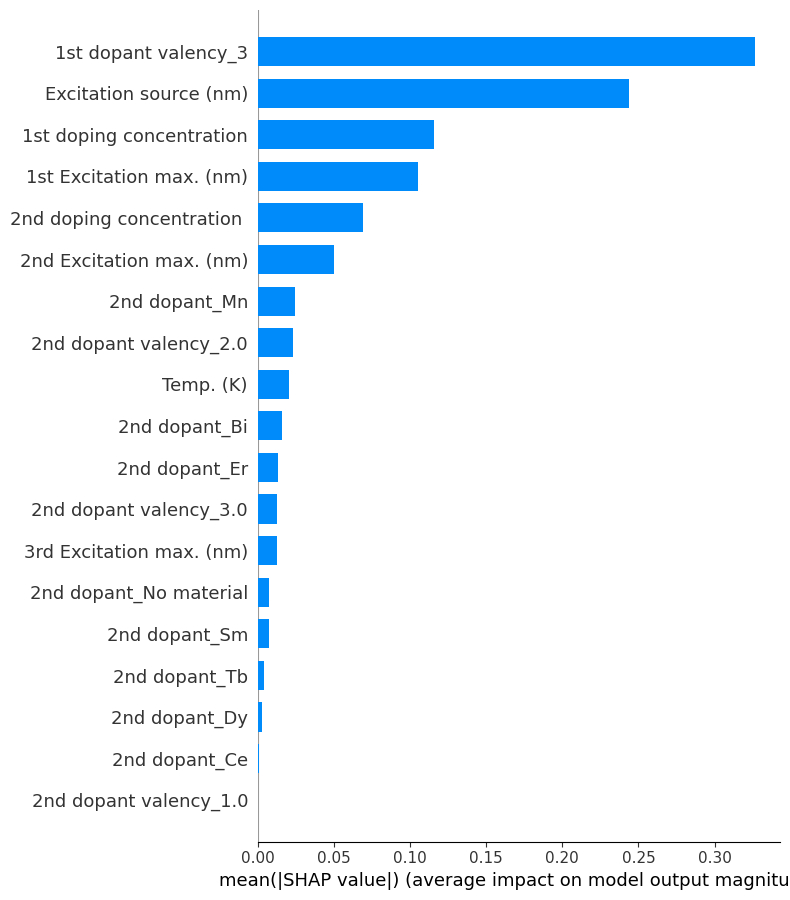

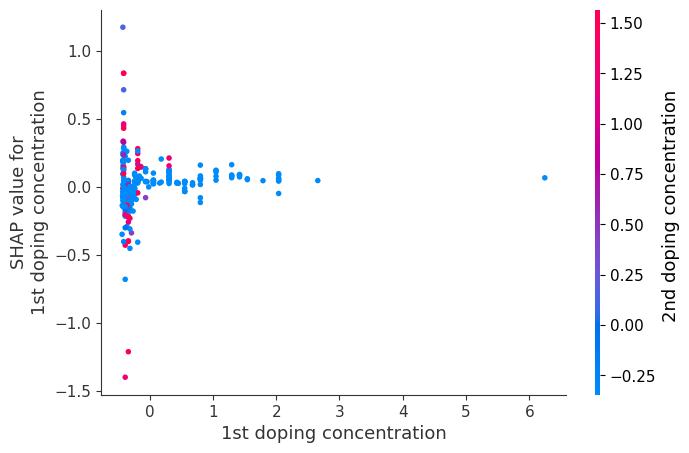

In [105]:
import shap
import catboost
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor, Pool

# 1. 读取数据
# 假设你已经有训练好的数据 X_train, y_train, X_test
# 这里你需要替换 X_train, X_test, y_train 为你的实际数据

# 2. 训练 CatBoost 模型（如果已有模型，可直接加载）
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', verbose=0)
model.fit(X_train, y_train)

# 3. 计算 SHAP 值
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# 4. 贡献度图 —— SHAP Summary Plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test, plot_type="bar")

# 5. 贡献度图 —— SHAP Force Plot (可视化单个样本)
shap.initjs()
sample_idx = 0  # 选择测试集中的第一个样本
shap.force_plot(explainer.expected_value, shap_values[sample_idx, :], X_test.iloc[sample_idx, :])

# 6. 贡献度图 —— SHAP Dependence Plot（分析某个特征）
shap.dependence_plot('1st doping concentration', shap_values, X_test)

plt.show()


In [41]:
import pandas as pd
from catboost import CatBoostRegressor

# 1. 训练好的 CatBoost 模型（如果已有模型，则加载）
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', verbose=0)
model.fit(X_train, y_train)  # 如果已经训练好，可以直接加载模型

# 2. 生成预测值
y_pred = model.predict(X_test)

# 3. 创建新的 DataFrame，包含真实值和预测值
results_df = pd.DataFrame({
    'Actual': y_test.values,   # 真实值
    'Predicted': y_pred        # 预测值
})

# 4. 保存到 CSV 文件
results_df.to_csv("catboost_Eu_lmd_predictions.csv", index=False)

# 5. 显示前几行数据
print(results_df.head())


     Actual  Predicted
0  0.457430   0.495076
1 -0.917396  -0.910794
2  0.457430   0.617450
3  0.559269   0.481467
4  0.508349   0.460493
